In [43]:
#%matplotlib notebook
import os
from datetime import datetime
from pathlib import Path
import math
import time
import numpy as np
import pandas as pd
from tabulate import tabulate
from matplotlib import pyplot as plt
import functools
import json

from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error

import importlib
import plt_utils as pu
import evaluator as ev
import SMOTER as smtr
import forecasting_models as fmod
import relevance as rlv
import prepare_data as dprep
import GAN as gmod

#allows update import custom modules without having to restart kernel:
importlib.reload(pu)
importlib.reload(ev)
importlib.reload(smtr)
importlib.reload(fmod)
importlib.reload(rlv)
importlib.reload(dprep)
importlib.reload(gmod)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

**Importing Data**

In [44]:
#If tvar and/or fvars not specified it'll just opt for the default specified by meta
def import_data(file_name, tvar=None, fvars=None):
    with open('data/meta.json','r') as file:
        meta = json.load(file)
    meta = meta[file_name]
    ds_name = meta['name']
    if file_name == 'london_merged.csv':
        #this dataset is multi-variate, can call this function with specified targets/features or just use defaults
        if not tvar: tvar = meta['tv']
        if not fvars: fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}")
        df=df.reset_index()[fvars if tvar in fvars else [tvar] + fvars]
    else:
        #rest of the datasets are univariate and don't have headers
        tvar = meta['tv']
        fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}", header=None, names=[tvar])
    return df, tvar, fvars, ds_name

#importing london_merged:
#DATA_FILE = 'london_merged.csv'
#df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

#importing baseline:
DATA_FILE = 'lorenz.dat.txt'
df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

N_FVARS = len(FVARS)
print(df1)

       Simulated Lorenz Values
0                    -0.156058
1                    -0.071057
2                     0.004560
3                     0.072342
4                     0.133683
...                        ...
16379                 7.229871
16380                 6.280668
16381                 5.387925
16382                 4.557258
16383                 3.791413

[16384 rows x 1 columns]


In [45]:
FORECASTERS = ["LSTM", "CNN"]

In [46]:
import recorder as rec
importlib.reload(rec)
to_save = {'forecast_models': False,
           'forecast_results': False,
           'resample_models': False, #best GANs 
           'resample_results': True,
           'eval_results': True, #evaluation metrics
           'logs': True,
           'figures': True,
           'parameters': True,
          }

RECORDER = rec.ExperimentRecorder(to_save, "Bike", FORECASTERS)
#LOADER = rec.ExperimentLoader(to_load, "Bike")
#load results from a previous session to compare with results from this session
#base_results_dir must contain resampling results and eval results to combine results
COMBINE_RESULTS_DIR = None #"Sessions/Bike/2023-October-13 13-41-03-532984"

#set GAN_DIR to none to train a new GAN, else give it a folder path to load from
GAN_CNN_DIR = None
GAN_FNN_DIR = None
#GAN_FNN_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\resample_models")

#set FORECAST_DIR to none to train a new LSTM, else give it a folder path to load from
FORECAST_DIR = None
#FORECAST_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\forecast_models")
loadedModels = {"loadedModels": {"GanCnnDir": GAN_CNN_DIR, "GanFnnDir":GAN_FNN_DIR, "ForecastDir": FORECAST_DIR}}
RECORDER.save_param_dict(loadedModels)

**Prepare Data for Resampling/Training**
* Split dataset into train and test split
* Convert data into Taken embedded time series format

In [47]:
RECORDER.log_print(f"Using data from: {DATA_FILE}")
RECORDER.log_print(f"Using feature variables: {FVARS} to predict target variable: '{TVAR}'")
RECORDER.save_param_dict({"importingData":{"dataFile":DATA_FILE,"targetVar":TVAR,"featVars":FVARS}})

df1 = np.array(df1).reshape(-1,N_FVARS)

scaler=MinMaxScaler(feature_range=(0,1))
df1 = df1.reshape(-1,N_FVARS)
scaled_data = scaler.fit_transform(df1) 
print(f"scaled_data: {scaled_data.shape}")

#Prep Data
N_STEPS_IN = 5
N_STEPS_OUT = 5
SPLIT_RATIO = 0.7
SAMPLE_DIM = N_STEPS_IN*N_FVARS + N_STEPS_OUT

k_X, X_train, Y_train, X_test, Y_test = dprep.split_data(scaled_data, N_STEPS_IN, N_STEPS_OUT, FVARS, N_FVARS, TVAR, SPLIT_RATIO)

RECORDER.save_param_dict({"prepData":{"nStepsIn":N_STEPS_IN,"nStepsOut":N_STEPS_OUT,"splitRatio":SPLIT_RATIO}})
RECORDER.log_print(f"Embedding steps in: {N_STEPS_IN} and steps out: {N_STEPS_OUT}")
RECORDER.log_print(f"Split dataset with training ratio: {SPLIT_RATIO}")
RECORDER.log_print(f"""Split data shapes:\n\t X_train: {X_train.shape}\n\t Y_train: {Y_train.shape}\n\t X_test: {X_test.shape}\n\t Y_test: {Y_test.shape}\n\t k_X: {k_X.shape}""")

LOG: 22:10:40:904 Using data from: lorenz.dat.txt

LOG: 22:10:40:905 Using feature variables: ['Simulated Lorenz Values'] to predict target variable: 'Simulated Lorenz Values'

scaled_data: (16384, 1)
LOG: 22:10:40:913 Embedding steps in: 5 and steps out: 5

LOG: 22:10:40:914 Split dataset with training ratio: 0.7

LOG: 22:10:40:914 Split data shapes:
	 X_train: (11462, 5, 1)
	 Y_train: (11462, 5)
	 X_test: (4913, 5, 1)
	 Y_test: (4913, 5)
	 k_X: (11462, 10)



**Relevance**

In [48]:
#give this guy a list of training target values and it will give you a function that you can input target values to get a relevance score
def getPoisRelFunc(y):
    sample_mean = np.mean(y) 
    sample_std = np.std(y)
    rel_quant = np.quantile(1/rlv.dpois(y,sample_mean),0.5)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"Pois","funcParams":{}}})
    return functools.partial(rlv.poisRelevance, smean=sample_mean, sstd=sample_std, rshift=rel_quant)
    
def getPCHIPRelFunc(y, percs, rels):
    pchip = rlv.PCHIP_interpolator(y, percs, rels)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"PCHIP","funcParams":{"percentages":list(percs),"rels":list(rels)}}})
    return functools.partial(rlv.PCHIPRelevance, pchip_func=pchip)

all_train_targets = np.append(Y_train[:,0],Y_train[-1,1:]) 
#RELEVANCE_THRESHOLD = 0.31
#RELEVANCE_FUNCTION = getPoisRelFunc(all_train_targets)
RELEVANCE_THRESHOLD = 0.9
pchip_percentiles = [25,95,99]#[25,50,75,95,99]
pchip_relevances = [0.0,0.75,1.0]#[0.0,0.25,0.5,0.75,1.0]
RELEVANCE_FUNCTION = getPCHIPRelFunc(all_train_targets, pchip_percentiles, pchip_relevances) 
EXTREMES_THRESHOLD = rlv.PCHIPApproxInverse(RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION, 0, 0.99) #target value that intersects with RELEVANCE_THRESHOLD

COMBINE = 'first'
r_Y = RELEVANCE_FUNCTION.__call__(Y_train, combine=COMBINE)
k_Y = [val >= RELEVANCE_THRESHOLD for val in r_Y]

RECORDER.save_param_dict({"relevance":{"relThresh":RELEVANCE_THRESHOLD,"exThresh": EXTREMES_THRESHOLD}})

num_rel=k_Y.count(True)

RECORDER.log_print(f"Relevance function {RELEVANCE_FUNCTION.func.__name__} used with threshold: {RELEVANCE_THRESHOLD}")
RECORDER.log_print(f"Relevance {len(k_Y)-num_rel} common values, {num_rel} relevant values")

r_Y = np.array(r_Y)
k_Y = np.array(k_Y)
k_Xex = k_X[k_Y]
print(f"r_Y: {r_Y.shape}")
#print(r_Y)
print(f"k_Y: {k_Y.shape}")
#print(k_Y)
print(f"k_Xex: {k_Xex.shape}")

LOG: 22:10:40:935 Relevance function PCHIPRelevance used with threshold: 0.9

LOG: 22:10:40:936 Relevance 11177 common values, 285 relevant values

r_Y: (11462,)
k_Y: (11462,)
k_Xex: (285, 10)


***Plot Relevance Information***

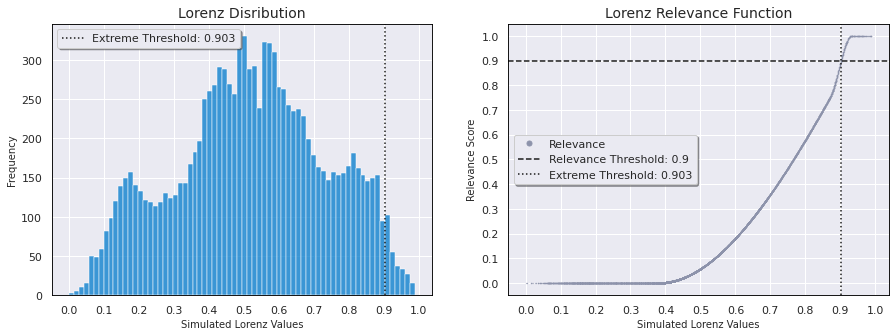

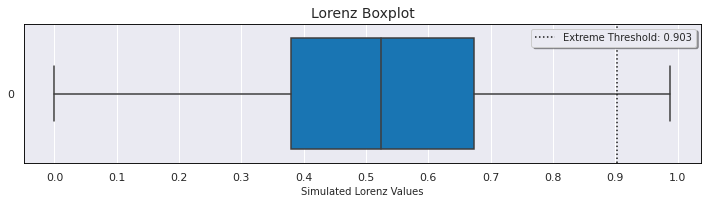

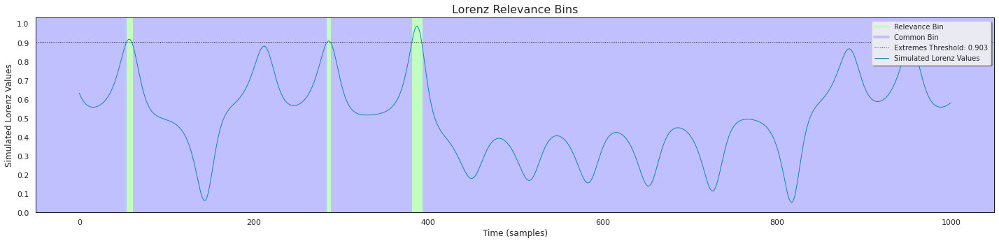

In [49]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)

#pu.PlotScaledData(data, TVAR)

r_Y_plot = RELEVANCE_FUNCTION.__call__(all_train_targets, combine=COMBINE) #relevance for plotting
k_Y_plot = [val >= RELEVANCE_THRESHOLD for val in r_Y_plot]
r_Y_plot = np.array(r_Y_plot)
k_Y_plot = np.array(k_Y_plot)

pu.PlotRelevance(all_train_targets, r_Y_plot, RELEVANCE_THRESHOLD, EXTREMES_THRESHOLD, TVAR, DATA_NAME)

#pu.PlotCaseWeightSurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)
#pu.PlotUtilitySurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)

#pu.PlotBins(all_train_targets,k_Y_plot,EXTREMES_THRESHOLD, TVAR, DATA_NAME)
pu.PlotBins(all_train_targets[3000:4000],k_Y_plot[3000:4000],EXTREMES_THRESHOLD, TVAR, DATA_NAME)

# **Resampling**

In [50]:
RES_STRATS = ["SMOTER_regular", "SMOTER_bin", "SMOTER_bin_t", "SMOTER_bin_r", "SMOTER_bin_tr", "GAN_CNN", "GAN_FNN"]

**Define GAN Models**

In [51]:
import GAN as gmod
importlib.reload(gmod)

n_gan_epochs = 120
gan_batch_size = 128

CNN_GENS=None; CNN_DISCS=None; FNN_GENS=None; FNN_DISC=None

if "GAN_CNN" in RES_STRATS:
    CNN_GENS, CNN_DISCS = gmod.getGAN(k_Xex,GAN_CNN_DIR, "CNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)
if "GAN_FNN" in RES_STRATS:
    FNN_GENS, FNN_DISCS = gmod.getGAN(k_Xex,GAN_FNN_DIR, "FNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)

RECORDER.save_param_dict({"GAN":{"nEpochs":n_gan_epochs,"batchSize": gan_batch_size}})
print("$$$$ Finished training GANs $$$$")

LOG: 22:10:41:820 Training CNN GAN with 120 epochs



  0%|          | 0/3 [00:00<?, ?it/s]

Step 1: Generator loss: 1.3343102931976318, discriminator loss: 1.3929133415222168
Step 2: Generator loss: 0.648108184337616, discriminator loss: 0.6928956508636475


  0%|          | 0/3 [00:00<?, ?it/s]

Step 3: Generator loss: 0.6382200121879578, discriminator loss: 0.6898781061172485
Step 4: Generator loss: 0.6300789713859558, discriminator loss: 0.6865124702453613
Step 5: Generator loss: 0.6232733130455017, discriminator loss: 0.6834732294082642


  0%|          | 0/3 [00:00<?, ?it/s]

Step 6: Generator loss: 0.6172491908073425, discriminator loss: 0.6809296011924744
Step 7: Generator loss: 0.6117696762084961, discriminator loss: 0.6789935827255249
Step 8: Generator loss: 0.6040164232254028, discriminator loss: 0.6784098148345947


  0%|          | 0/3 [00:00<?, ?it/s]

Step 9: Generator loss: 0.5992641448974609, discriminator loss: 0.6788257360458374
Step 10: Generator loss: 0.5937762260437012, discriminator loss: 0.6795811057090759
Step 11: Generator loss: 0.5920417308807373, discriminator loss: 0.6809263229370117


  0%|          | 0/3 [00:00<?, ?it/s]

Step 12: Generator loss: 0.5868751406669617, discriminator loss: 0.681978702545166
Step 13: Generator loss: 0.5847817659378052, discriminator loss: 0.6845002174377441
Step 14: Generator loss: 0.5858540534973145, discriminator loss: 0.6860256195068359


  0%|          | 0/3 [00:00<?, ?it/s]

Step 15: Generator loss: 0.587813138961792, discriminator loss: 0.6868771314620972
Step 16: Generator loss: 0.5908460021018982, discriminator loss: 0.6865558624267578
Step 17: Generator loss: 0.5979122519493103, discriminator loss: 0.6869858503341675


  0%|          | 0/3 [00:00<?, ?it/s]

Step 18: Generator loss: 0.6054860353469849, discriminator loss: 0.6858593821525574
Step 19: Generator loss: 0.6156263947486877, discriminator loss: 0.6843389272689819
Step 20: Generator loss: 0.6265777349472046, discriminator loss: 0.6831029653549194


  0%|          | 0/3 [00:00<?, ?it/s]

Step 21: Generator loss: 0.6389071941375732, discriminator loss: 0.6805728077888489
Step 22: Generator loss: 0.6518599987030029, discriminator loss: 0.6785125732421875
Step 23: Generator loss: 0.6652407646179199, discriminator loss: 0.6751114130020142


  0%|          | 0/3 [00:00<?, ?it/s]

Step 24: Generator loss: 0.6794036030769348, discriminator loss: 0.6735336780548096
Step 25: Generator loss: 0.6929737329483032, discriminator loss: 0.671562671661377
Step 26: Generator loss: 0.7060418725013733, discriminator loss: 0.6699801683425903


  0%|          | 0/3 [00:00<?, ?it/s]

Step 27: Generator loss: 0.7176406383514404, discriminator loss: 0.6679005026817322
Step 28: Generator loss: 0.7278491258621216, discriminator loss: 0.6669163703918457
Step 29: Generator loss: 0.7360450625419617, discriminator loss: 0.6660506725311279


  0%|          | 0/3 [00:00<?, ?it/s]

Step 30: Generator loss: 0.7423880100250244, discriminator loss: 0.6661452054977417
Step 31: Generator loss: 0.746640682220459, discriminator loss: 0.6666448712348938
Step 32: Generator loss: 0.7469409704208374, discriminator loss: 0.6693551540374756


  0%|          | 0/3 [00:00<?, ?it/s]

Step 33: Generator loss: 0.7465280890464783, discriminator loss: 0.6715761423110962
Step 34: Generator loss: 0.7391787767410278, discriminator loss: 0.6756508350372314
Step 35: Generator loss: 0.7324032783508301, discriminator loss: 0.6798141002655029


  0%|          | 0/3 [00:00<?, ?it/s]

Step 36: Generator loss: 0.7237077951431274, discriminator loss: 0.6837399005889893
Step 37: Generator loss: 0.7158018946647644, discriminator loss: 0.6886932849884033
Step 38: Generator loss: 0.7071553468704224, discriminator loss: 0.6924300193786621


  0%|          | 0/3 [00:00<?, ?it/s]

Step 39: Generator loss: 0.702601432800293, discriminator loss: 0.697004497051239
Step 40: Generator loss: 0.6975920796394348, discriminator loss: 0.6994324922561646
Step 41: Generator loss: 0.6965430974960327, discriminator loss: 0.7004989385604858


  0%|          | 0/3 [00:00<?, ?it/s]

Step 42: Generator loss: 0.6956809163093567, discriminator loss: 0.701423704624176
Step 43: Generator loss: 0.6966183185577393, discriminator loss: 0.7009732723236084
Step 44: Generator loss: 0.6985185742378235, discriminator loss: 0.700474739074707


  0%|          | 0/3 [00:00<?, ?it/s]

Step 45: Generator loss: 0.701829195022583, discriminator loss: 0.6979646682739258
Step 46: Generator loss: 0.7054718732833862, discriminator loss: 0.6954636573791504
Step 47: Generator loss: 0.7093452215194702, discriminator loss: 0.6924593448638916


  0%|          | 0/3 [00:00<?, ?it/s]

Step 48: Generator loss: 0.7141485214233398, discriminator loss: 0.689125120639801
Step 49: Generator loss: 0.7180870771408081, discriminator loss: 0.6854254007339478
Step 50: Generator loss: 0.721772313117981, discriminator loss: 0.6813832521438599


  0%|          | 0/3 [00:00<?, ?it/s]

Step 51: Generator loss: 0.7252033352851868, discriminator loss: 0.6779205799102783
Step 52: Generator loss: 0.7273188233375549, discriminator loss: 0.675058126449585
Step 53: Generator loss: 0.7272248268127441, discriminator loss: 0.6718592643737793


  0%|          | 0/3 [00:00<?, ?it/s]

Step 54: Generator loss: 0.7275536060333252, discriminator loss: 0.6697753667831421
Step 55: Generator loss: 0.721782922744751, discriminator loss: 0.6693711876869202
Step 56: Generator loss: 0.7160574197769165, discriminator loss: 0.6716508865356445


  0%|          | 0/3 [00:00<?, ?it/s]

Step 57: Generator loss: 0.7037988901138306, discriminator loss: 0.6730676889419556
Step 58: Generator loss: 0.6897021532058716, discriminator loss: 0.6781551837921143
Step 59: Generator loss: 0.6748625040054321, discriminator loss: 0.6829047799110413


  0%|          | 0/3 [00:00<?, ?it/s]

Step 60: Generator loss: 0.6652740240097046, discriminator loss: 0.6893625259399414
Step 61: Generator loss: 0.6532970666885376, discriminator loss: 0.6934850811958313
Step 62: Generator loss: 0.6477325558662415, discriminator loss: 0.6996496915817261


  0%|          | 0/3 [00:00<?, ?it/s]

Step 63: Generator loss: 0.6444334387779236, discriminator loss: 0.7023797035217285
Step 64: Generator loss: 0.643923282623291, discriminator loss: 0.7057528495788574
Step 65: Generator loss: 0.6457945704460144, discriminator loss: 0.7073384523391724


  0%|          | 0/3 [00:00<?, ?it/s]

Step 66: Generator loss: 0.6491718888282776, discriminator loss: 0.7075693607330322
Step 67: Generator loss: 0.655337393283844, discriminator loss: 0.7070930004119873
Step 68: Generator loss: 0.6624764204025269, discriminator loss: 0.7080366015434265


  0%|          | 0/3 [00:00<?, ?it/s]

Step 69: Generator loss: 0.6713590621948242, discriminator loss: 0.7045538425445557
Step 70: Generator loss: 0.6802594661712646, discriminator loss: 0.7024837136268616
Step 71: Generator loss: 0.6889287233352661, discriminator loss: 0.7000271677970886


  0%|          | 0/3 [00:00<?, ?it/s]

Step 72: Generator loss: 0.6963059306144714, discriminator loss: 0.6976280808448792
Step 73: Generator loss: 0.7029832005500793, discriminator loss: 0.6949683427810669
Step 74: Generator loss: 0.709105908870697, discriminator loss: 0.6923208236694336


  0%|          | 0/3 [00:00<?, ?it/s]

Step 75: Generator loss: 0.7142413258552551, discriminator loss: 0.6905868053436279
Step 76: Generator loss: 0.7183511257171631, discriminator loss: 0.6874790787696838
Step 77: Generator loss: 0.7232339978218079, discriminator loss: 0.6845744848251343


  0%|          | 0/3 [00:00<?, ?it/s]

Step 78: Generator loss: 0.7291848063468933, discriminator loss: 0.6799044609069824
Step 79: Generator loss: 0.7349033355712891, discriminator loss: 0.6759200692176819
Step 80: Generator loss: 0.7407975792884827, discriminator loss: 0.6696974039077759


  0%|          | 0/3 [00:00<?, ?it/s]

Step 81: Generator loss: 0.7454454898834229, discriminator loss: 0.6653864979743958
Step 82: Generator loss: 0.7494872212409973, discriminator loss: 0.6598265171051025
Step 83: Generator loss: 0.7512875199317932, discriminator loss: 0.6564732789993286


  0%|          | 0/3 [00:00<?, ?it/s]

Step 84: Generator loss: 0.750663161277771, discriminator loss: 0.6527498960494995
Step 85: Generator loss: 0.743501603603363, discriminator loss: 0.6509434580802917
Step 86: Generator loss: 0.7329164743423462, discriminator loss: 0.6509413719177246


  0%|          | 0/3 [00:00<?, ?it/s]

Step 87: Generator loss: 0.7137309908866882, discriminator loss: 0.65751051902771
Step 88: Generator loss: 0.6898956298828125, discriminator loss: 0.664324164390564
Step 89: Generator loss: 0.6679643988609314, discriminator loss: 0.6761316657066345


  0%|          | 0/3 [00:00<?, ?it/s]

Step 90: Generator loss: 0.6486099362373352, discriminator loss: 0.682331919670105
Step 91: Generator loss: 0.6376763582229614, discriminator loss: 0.6877851486206055
Step 92: Generator loss: 0.6327342987060547, discriminator loss: 0.6892876625061035


  0%|          | 0/3 [00:00<?, ?it/s]

Step 93: Generator loss: 0.6338590979576111, discriminator loss: 0.6893711090087891
Step 94: Generator loss: 0.6399343013763428, discriminator loss: 0.6861238479614258
Step 95: Generator loss: 0.6492074728012085, discriminator loss: 0.6825061440467834


  0%|          | 0/3 [00:00<?, ?it/s]

Step 96: Generator loss: 0.6607977747917175, discriminator loss: 0.6758890151977539
Step 97: Generator loss: 0.6739851236343384, discriminator loss: 0.6701905727386475
Step 98: Generator loss: 0.6885431408882141, discriminator loss: 0.6621472835540771


  0%|          | 0/3 [00:00<?, ?it/s]

Step 99: Generator loss: 0.703727662563324, discriminator loss: 0.6558563709259033
Step 100: Generator loss: 0.7192527651786804, discriminator loss: 0.648603081703186
Step 101: Generator loss: 0.7349811792373657, discriminator loss: 0.6393232345581055


  0%|          | 0/3 [00:00<?, ?it/s]

Step 102: Generator loss: 0.7506370544433594, discriminator loss: 0.633531391620636
Step 103: Generator loss: 0.766026496887207, discriminator loss: 0.6263905763626099
Step 104: Generator loss: 0.7809568643569946, discriminator loss: 0.6169358491897583


  0%|          | 0/3 [00:00<?, ?it/s]

Step 105: Generator loss: 0.7953773736953735, discriminator loss: 0.611548900604248
Step 106: Generator loss: 0.8091842532157898, discriminator loss: 0.603986382484436
Step 107: Generator loss: 0.8223903179168701, discriminator loss: 0.5973030924797058


  0%|          | 0/3 [00:00<?, ?it/s]

Step 108: Generator loss: 0.8350309729576111, discriminator loss: 0.5897151231765747
Step 109: Generator loss: 0.846854567527771, discriminator loss: 0.583206057548523
Step 110: Generator loss: 0.8579568266868591, discriminator loss: 0.5767825841903687


  0%|          | 0/3 [00:00<?, ?it/s]

Step 111: Generator loss: 0.8686337471008301, discriminator loss: 0.5694345831871033
Step 112: Generator loss: 0.878334105014801, discriminator loss: 0.5622960329055786
Step 113: Generator loss: 0.8875827193260193, discriminator loss: 0.5570964217185974


  0%|          | 0/3 [00:00<?, ?it/s]

Step 114: Generator loss: 0.8960366249084473, discriminator loss: 0.5497176647186279
Step 115: Generator loss: 0.9039630889892578, discriminator loss: 0.5428953170776367
Step 116: Generator loss: 0.9115722179412842, discriminator loss: 0.5364377498626709


  0%|          | 0/3 [00:00<?, ?it/s]

Step 117: Generator loss: 0.9186804294586182, discriminator loss: 0.5309833288192749
Step 118: Generator loss: 0.9254372119903564, discriminator loss: 0.5238645076751709
Step 119: Generator loss: 0.9321433305740356, discriminator loss: 0.5172905921936035


  0%|          | 0/3 [00:00<?, ?it/s]

Step 120: Generator loss: 0.9380697011947632, discriminator loss: 0.5127993822097778
Step 121: Generator loss: 0.9443306922912598, discriminator loss: 0.5060652494430542
Step 122: Generator loss: 0.950562596321106, discriminator loss: 0.5001885890960693


  0%|          | 0/3 [00:00<?, ?it/s]

Step 123: Generator loss: 0.95646733045578, discriminator loss: 0.4942498803138733
Step 124: Generator loss: 0.9629086852073669, discriminator loss: 0.49080681800842285
Step 125: Generator loss: 0.9683196544647217, discriminator loss: 0.4834643602371216


  0%|          | 0/3 [00:00<?, ?it/s]

Step 126: Generator loss: 0.9749444723129272, discriminator loss: 0.4795214533805847
Step 127: Generator loss: 0.9798062443733215, discriminator loss: 0.4746169149875641
Step 128: Generator loss: 0.9849465489387512, discriminator loss: 0.4679564833641052


  0%|          | 0/3 [00:00<?, ?it/s]

Step 129: Generator loss: 0.9887704253196716, discriminator loss: 0.4664604961872101
Step 130: Generator loss: 0.9892261624336243, discriminator loss: 0.46233025193214417
Step 131: Generator loss: 0.9887332320213318, discriminator loss: 0.46203893423080444


  0%|          | 0/3 [00:00<?, ?it/s]

Step 132: Generator loss: 0.975299596786499, discriminator loss: 0.4633468985557556
Step 133: Generator loss: 0.9496070742607117, discriminator loss: 0.4680064618587494
Step 134: Generator loss: 0.9081783294677734, discriminator loss: 0.4774446189403534


  0%|          | 0/3 [00:00<?, ?it/s]

Step 135: Generator loss: 0.8668212294578552, discriminator loss: 0.49464231729507446
Step 136: Generator loss: 0.8107655644416809, discriminator loss: 0.5140239000320435
Step 137: Generator loss: 0.7646196484565735, discriminator loss: 0.5343264937400818


  0%|          | 0/3 [00:00<?, ?it/s]

Step 138: Generator loss: 0.7293583154678345, discriminator loss: 0.5529485940933228
Step 139: Generator loss: 0.7068045735359192, discriminator loss: 0.5677180290222168
Step 140: Generator loss: 0.7006458640098572, discriminator loss: 0.5764262676239014


  0%|          | 0/3 [00:00<?, ?it/s]

Step 141: Generator loss: 0.701552152633667, discriminator loss: 0.5780054926872253
Step 142: Generator loss: 0.7100445032119751, discriminator loss: 0.5795838832855225
Step 143: Generator loss: 0.7245577573776245, discriminator loss: 0.5785247087478638


  0%|          | 0/3 [00:00<?, ?it/s]

Step 144: Generator loss: 0.7443839311599731, discriminator loss: 0.5717069506645203
Step 145: Generator loss: 0.7671078443527222, discriminator loss: 0.5675512552261353
Step 146: Generator loss: 0.7921462655067444, discriminator loss: 0.5608502626419067


  0%|          | 0/3 [00:00<?, ?it/s]

Step 147: Generator loss: 0.8178607821464539, discriminator loss: 0.5538592338562012
Step 148: Generator loss: 0.8436980843544006, discriminator loss: 0.5464982390403748
Step 149: Generator loss: 0.8689671158790588, discriminator loss: 0.5421892404556274


  0%|          | 0/3 [00:00<?, ?it/s]

Step 150: Generator loss: 0.8932419419288635, discriminator loss: 0.533993124961853
Step 151: Generator loss: 0.9161781072616577, discriminator loss: 0.5267634391784668
Step 152: Generator loss: 0.9375457167625427, discriminator loss: 0.5217743515968323


  0%|          | 0/3 [00:00<?, ?it/s]

Step 153: Generator loss: 0.9563180208206177, discriminator loss: 0.5140635371208191
Step 154: Generator loss: 0.9739338755607605, discriminator loss: 0.5094007849693298
Step 155: Generator loss: 0.9883370399475098, discriminator loss: 0.5002444982528687


  0%|          | 0/3 [00:00<?, ?it/s]

Step 156: Generator loss: 1.0016262531280518, discriminator loss: 0.4970282018184662
Step 157: Generator loss: 1.0109962224960327, discriminator loss: 0.49114030599594116
Step 158: Generator loss: 1.0172165632247925, discriminator loss: 0.4868212938308716


  0%|          | 0/3 [00:00<?, ?it/s]

Step 159: Generator loss: 1.018249750137329, discriminator loss: 0.4829797148704529
Step 160: Generator loss: 1.0116552114486694, discriminator loss: 0.4813593029975891
Step 161: Generator loss: 0.9949397444725037, discriminator loss: 0.4836953282356262


  0%|          | 0/3 [00:00<?, ?it/s]

Step 162: Generator loss: 0.9570969343185425, discriminator loss: 0.4896622896194458
Step 163: Generator loss: 0.903468668460846, discriminator loss: 0.5046873092651367
Step 164: Generator loss: 0.8141493201255798, discriminator loss: 0.5261448621749878


  0%|          | 0/3 [00:00<?, ?it/s]

Step 165: Generator loss: 0.7398608922958374, discriminator loss: 0.5620882511138916
Step 166: Generator loss: 0.6628217101097107, discriminator loss: 0.5996061563491821
Step 167: Generator loss: 0.5856907963752747, discriminator loss: 0.6498357057571411


  0%|          | 0/3 [00:00<?, ?it/s]

Step 168: Generator loss: 0.5391021966934204, discriminator loss: 0.6746997833251953
Step 169: Generator loss: 0.5149813294410706, discriminator loss: 0.7015634775161743
Step 170: Generator loss: 0.5060811042785645, discriminator loss: 0.7117837071418762


  0%|          | 0/3 [00:00<?, ?it/s]

Step 171: Generator loss: 0.5101363658905029, discriminator loss: 0.713926374912262
Step 172: Generator loss: 0.5175429582595825, discriminator loss: 0.7122552990913391
Step 173: Generator loss: 0.5238792896270752, discriminator loss: 0.7119646072387695


  0%|          | 0/3 [00:00<?, ?it/s]

Step 174: Generator loss: 0.5381117463111877, discriminator loss: 0.7114381790161133
Step 175: Generator loss: 0.5488725304603577, discriminator loss: 0.7106297612190247
Step 176: Generator loss: 0.5654047131538391, discriminator loss: 0.7064515352249146


  0%|          | 0/3 [00:00<?, ?it/s]

Step 177: Generator loss: 0.5800402164459229, discriminator loss: 0.7032722234725952
Step 178: Generator loss: 0.5989630222320557, discriminator loss: 0.6979739665985107
Step 179: Generator loss: 0.6145955324172974, discriminator loss: 0.6939454078674316


  0%|          | 0/3 [00:00<?, ?it/s]

Step 180: Generator loss: 0.6276360154151917, discriminator loss: 0.6906268000602722
Step 181: Generator loss: 0.6374720931053162, discriminator loss: 0.6886180639266968
Step 182: Generator loss: 0.6444032192230225, discriminator loss: 0.6885485053062439


  0%|          | 0/3 [00:00<?, ?it/s]

Step 183: Generator loss: 0.6558791995048523, discriminator loss: 0.6849653720855713
Step 184: Generator loss: 0.6692607402801514, discriminator loss: 0.6793394088745117
Step 185: Generator loss: 0.687859833240509, discriminator loss: 0.6712771654129028


  0%|          | 0/3 [00:00<?, ?it/s]

Step 186: Generator loss: 0.706735372543335, discriminator loss: 0.6614071130752563
Step 187: Generator loss: 0.727443277835846, discriminator loss: 0.6510763764381409
Step 188: Generator loss: 0.7484696507453918, discriminator loss: 0.6367754936218262


  0%|          | 0/3 [00:00<?, ?it/s]

Step 189: Generator loss: 0.768656849861145, discriminator loss: 0.6267120242118835
Step 190: Generator loss: 0.788337230682373, discriminator loss: 0.6147127151489258
Step 191: Generator loss: 0.8071098327636719, discriminator loss: 0.6055362224578857


  0%|          | 0/3 [00:00<?, ?it/s]

Step 192: Generator loss: 0.8250105977058411, discriminator loss: 0.5907210111618042
Step 193: Generator loss: 0.8419128060340881, discriminator loss: 0.579644501209259
Step 194: Generator loss: 0.8576812744140625, discriminator loss: 0.5697847604751587


  0%|          | 0/3 [00:00<?, ?it/s]

Step 195: Generator loss: 0.8727962970733643, discriminator loss: 0.5569509863853455
Step 196: Generator loss: 0.8870046138763428, discriminator loss: 0.5460190773010254
Step 197: Generator loss: 0.8999229669570923, discriminator loss: 0.5337987542152405


  0%|          | 0/3 [00:00<?, ?it/s]

Step 198: Generator loss: 0.9119920134544373, discriminator loss: 0.5248483419418335
Step 199: Generator loss: 0.9234213829040527, discriminator loss: 0.514947235584259
Step 200: Generator loss: 0.9330208897590637, discriminator loss: 0.5063564777374268


  0%|          | 0/3 [00:00<?, ?it/s]

Step 201: Generator loss: 0.9397582411766052, discriminator loss: 0.49855607748031616
Step 202: Generator loss: 0.9424132108688354, discriminator loss: 0.49020272493362427
Step 203: Generator loss: 0.9389551877975464, discriminator loss: 0.48370906710624695


  0%|          | 0/3 [00:00<?, ?it/s]

Step 204: Generator loss: 0.9261540174484253, discriminator loss: 0.48464474081993103
Step 205: Generator loss: 0.9063379764556885, discriminator loss: 0.48397842049598694
Step 206: Generator loss: 0.8835526704788208, discriminator loss: 0.4886848032474518


  0%|          | 0/3 [00:00<?, ?it/s]

Step 207: Generator loss: 0.876358151435852, discriminator loss: 0.48674339056015015
Step 208: Generator loss: 0.8713382482528687, discriminator loss: 0.4841827154159546
Step 209: Generator loss: 0.8751838207244873, discriminator loss: 0.47822654247283936


  0%|          | 0/3 [00:00<?, ?it/s]

Step 210: Generator loss: 0.8879693150520325, discriminator loss: 0.47062066197395325
Step 211: Generator loss: 0.9028835892677307, discriminator loss: 0.4605453610420227
Step 212: Generator loss: 0.9202446937561035, discriminator loss: 0.45270588994026184


  0%|          | 0/3 [00:00<?, ?it/s]

Step 213: Generator loss: 0.9389135241508484, discriminator loss: 0.4417151212692261
Step 214: Generator loss: 0.9584496021270752, discriminator loss: 0.43301308155059814
Step 215: Generator loss: 0.978560745716095, discriminator loss: 0.4218536615371704


  0%|          | 0/3 [00:00<?, ?it/s]

Step 216: Generator loss: 0.9991881847381592, discriminator loss: 0.413043349981308
Step 217: Generator loss: 1.02000892162323, discriminator loss: 0.40451109409332275
Step 218: Generator loss: 1.0410516262054443, discriminator loss: 0.3950720429420471


  0%|          | 0/3 [00:00<?, ?it/s]

Step 219: Generator loss: 1.0621834993362427, discriminator loss: 0.38555410504341125
Step 220: Generator loss: 1.0832537412643433, discriminator loss: 0.3781484365463257
Step 221: Generator loss: 1.104219913482666, discriminator loss: 0.3692375421524048


  0%|          | 0/3 [00:00<?, ?it/s]

Step 222: Generator loss: 1.1250284910202026, discriminator loss: 0.3602733612060547
Step 223: Generator loss: 1.1456644535064697, discriminator loss: 0.3529054522514343
Step 224: Generator loss: 1.166039228439331, discriminator loss: 0.3464241623878479


  0%|          | 0/3 [00:00<?, ?it/s]

Step 225: Generator loss: 1.1863166093826294, discriminator loss: 0.335995614528656
Step 226: Generator loss: 1.2062751054763794, discriminator loss: 0.33061712980270386
Step 227: Generator loss: 1.2258899211883545, discriminator loss: 0.32475546002388


  0%|          | 0/3 [00:00<?, ?it/s]

Step 228: Generator loss: 1.2452174425125122, discriminator loss: 0.31549903750419617
Step 229: Generator loss: 1.2642853260040283, discriminator loss: 0.3090357184410095
Step 230: Generator loss: 1.283263921737671, discriminator loss: 0.30150240659713745


  0%|          | 0/3 [00:00<?, ?it/s]

Step 231: Generator loss: 1.3018503189086914, discriminator loss: 0.295886367559433
Step 232: Generator loss: 1.3200987577438354, discriminator loss: 0.28905171155929565
Step 233: Generator loss: 1.3380573987960815, discriminator loss: 0.2840120196342468


  0%|          | 0/3 [00:00<?, ?it/s]

Step 234: Generator loss: 1.3557225465774536, discriminator loss: 0.27755212783813477
Step 235: Generator loss: 1.3731300830841064, discriminator loss: 0.271828293800354
Step 236: Generator loss: 1.3903919458389282, discriminator loss: 0.26568517088890076


  0%|          | 0/3 [00:00<?, ?it/s]

Step 237: Generator loss: 1.407474160194397, discriminator loss: 0.2619788646697998
Step 238: Generator loss: 1.4244800806045532, discriminator loss: 0.25497299432754517
Step 239: Generator loss: 1.4413505792617798, discriminator loss: 0.2488459050655365


  0%|          | 0/3 [00:00<?, ?it/s]

Step 240: Generator loss: 1.4581434726715088, discriminator loss: 0.2462085336446762
Step 241: Generator loss: 1.474736213684082, discriminator loss: 0.24011212587356567
Step 242: Generator loss: 1.4911394119262695, discriminator loss: 0.23727025091648102


  0%|          | 0/3 [00:00<?, ?it/s]

Step 243: Generator loss: 1.5075396299362183, discriminator loss: 0.23140621185302734
Step 244: Generator loss: 1.5237596035003662, discriminator loss: 0.22759605944156647
Step 245: Generator loss: 1.5399174690246582, discriminator loss: 0.22324296832084656


  0%|          | 0/3 [00:00<?, ?it/s]

Step 246: Generator loss: 1.5559988021850586, discriminator loss: 0.21909946203231812
Step 247: Generator loss: 1.5718914270401, discriminator loss: 0.21488425135612488
Step 248: Generator loss: 1.587843656539917, discriminator loss: 0.20977553725242615


  0%|          | 0/3 [00:00<?, ?it/s]

Step 249: Generator loss: 1.6036638021469116, discriminator loss: 0.20742006599903107
Step 250: Generator loss: 1.619513750076294, discriminator loss: 0.2031242847442627
Step 251: Generator loss: 1.6352518796920776, discriminator loss: 0.1994296908378601


  0%|          | 0/3 [00:00<?, ?it/s]

Step 252: Generator loss: 1.650956392288208, discriminator loss: 0.1961544305086136
Step 253: Generator loss: 1.66652250289917, discriminator loss: 0.19341492652893066
Step 254: Generator loss: 1.6821928024291992, discriminator loss: 0.18697258830070496


  0%|          | 0/3 [00:00<?, ?it/s]

Step 255: Generator loss: 1.6976442337036133, discriminator loss: 0.18703815340995789
Step 256: Generator loss: 1.7131011486053467, discriminator loss: 0.18221263587474823
Step 257: Generator loss: 1.7286375761032104, discriminator loss: 0.1792651116847992


  0%|          | 0/3 [00:00<?, ?it/s]

Step 258: Generator loss: 1.7439285516738892, discriminator loss: 0.17670533061027527
Step 259: Generator loss: 1.759142279624939, discriminator loss: 0.17461097240447998
Step 260: Generator loss: 1.7744929790496826, discriminator loss: 0.16785123944282532


  0%|          | 0/3 [00:00<?, ?it/s]

Step 261: Generator loss: 1.7897520065307617, discriminator loss: 0.16852039098739624
Step 262: Generator loss: 1.8050193786621094, discriminator loss: 0.16481806337833405
Step 263: Generator loss: 1.8201556205749512, discriminator loss: 0.16262036561965942


  0%|          | 0/3 [00:00<?, ?it/s]

Step 264: Generator loss: 1.8351874351501465, discriminator loss: 0.1600496768951416
Step 265: Generator loss: 1.8501718044281006, discriminator loss: 0.15682819485664368
Step 266: Generator loss: 1.8650367259979248, discriminator loss: 0.15624552965164185


  0%|          | 0/3 [00:00<?, ?it/s]

Step 267: Generator loss: 1.8798301219940186, discriminator loss: 0.15210366249084473
Step 268: Generator loss: 1.89458167552948, discriminator loss: 0.14981096982955933
Step 269: Generator loss: 1.9091784954071045, discriminator loss: 0.14811164140701294


  0%|          | 0/3 [00:00<?, ?it/s]

Step 270: Generator loss: 1.923712968826294, discriminator loss: 0.1458899974822998
Step 271: Generator loss: 1.9382059574127197, discriminator loss: 0.1417814940214157
Step 272: Generator loss: 1.9525405168533325, discriminator loss: 0.14164111018180847


  0%|          | 0/3 [00:00<?, ?it/s]

Step 273: Generator loss: 1.9666717052459717, discriminator loss: 0.1389319896697998
Step 274: Generator loss: 1.9808253049850464, discriminator loss: 0.1358029544353485
Step 275: Generator loss: 1.9951629638671875, discriminator loss: 0.13388919830322266


  0%|          | 0/3 [00:00<?, ?it/s]

Step 276: Generator loss: 2.0092921257019043, discriminator loss: 0.13237957656383514
Step 277: Generator loss: 2.0234479904174805, discriminator loss: 0.12984752655029297
Step 278: Generator loss: 2.0372748374938965, discriminator loss: 0.1283189058303833


  0%|          | 0/3 [00:00<?, ?it/s]

Step 279: Generator loss: 2.0511465072631836, discriminator loss: 0.1259254813194275
Step 280: Generator loss: 2.0651092529296875, discriminator loss: 0.12444089353084564
Step 281: Generator loss: 2.078859806060791, discriminator loss: 0.12360134720802307


  0%|          | 0/3 [00:00<?, ?it/s]

Step 282: Generator loss: 2.0923335552215576, discriminator loss: 0.12130200862884521
Step 283: Generator loss: 2.1057395935058594, discriminator loss: 0.11845444142818451
Step 284: Generator loss: 2.119009494781494, discriminator loss: 0.11675888299942017


  0%|          | 0/3 [00:00<?, ?it/s]

Step 285: Generator loss: 2.1328184604644775, discriminator loss: 0.11482051014900208
Step 286: Generator loss: 2.1461281776428223, discriminator loss: 0.11420276761054993
Step 287: Generator loss: 2.1591379642486572, discriminator loss: 0.11350762844085693


  0%|          | 0/3 [00:00<?, ?it/s]

Step 288: Generator loss: 2.171635150909424, discriminator loss: 0.11042526364326477
Step 289: Generator loss: 2.1839661598205566, discriminator loss: 0.10934612154960632
Step 290: Generator loss: 2.1964759826660156, discriminator loss: 0.10752552002668381


  0%|          | 0/3 [00:00<?, ?it/s]

Step 291: Generator loss: 2.207515239715576, discriminator loss: 0.10603664070367813
Step 292: Generator loss: 2.216618061065674, discriminator loss: 0.10481254756450653
Step 293: Generator loss: 2.2224605083465576, discriminator loss: 0.10539504885673523


  0%|          | 0/3 [00:00<?, ?it/s]

Step 294: Generator loss: 2.2261998653411865, discriminator loss: 0.10329511761665344
Step 295: Generator loss: 2.21734356880188, discriminator loss: 0.1029072105884552
Step 296: Generator loss: 2.181323528289795, discriminator loss: 0.10493908077478409


  0%|          | 0/3 [00:00<?, ?it/s]

Step 297: Generator loss: 2.102238655090332, discriminator loss: 0.11025313287973404
Step 298: Generator loss: 1.9498002529144287, discriminator loss: 0.11895136535167694
Step 299: Generator loss: 1.7719013690948486, discriminator loss: 0.13994503021240234


  0%|          | 0/3 [00:00<?, ?it/s]

Step 300: Generator loss: 1.516890287399292, discriminator loss: 0.16815900802612305
Step 301: Generator loss: 1.3466159105300903, discriminator loss: 0.20023038983345032
Step 302: Generator loss: 1.2772561311721802, discriminator loss: 0.2145157903432846


  0%|          | 0/3 [00:00<?, ?it/s]

Step 303: Generator loss: 1.2360162734985352, discriminator loss: 0.2238611876964569
Step 304: Generator loss: 1.2531070709228516, discriminator loss: 0.22342538833618164
Step 305: Generator loss: 1.2916414737701416, discriminator loss: 0.2182939648628235


  0%|          | 0/3 [00:00<?, ?it/s]

Step 306: Generator loss: 1.3414404392242432, discriminator loss: 0.21160843968391418
Step 307: Generator loss: 1.3979145288467407, discriminator loss: 0.20470400154590607
Step 308: Generator loss: 1.4581842422485352, discriminator loss: 0.1958652138710022


  0%|          | 0/3 [00:00<?, ?it/s]

Step 309: Generator loss: 1.5197296142578125, discriminator loss: 0.19106526672840118
Step 310: Generator loss: 1.581918716430664, discriminator loss: 0.18471038341522217
Step 311: Generator loss: 1.643367052078247, discriminator loss: 0.18156465888023376


  0%|          | 0/3 [00:00<?, ?it/s]

Step 312: Generator loss: 1.7031967639923096, discriminator loss: 0.1746252477169037
Step 313: Generator loss: 1.7606263160705566, discriminator loss: 0.17237603664398193
Step 314: Generator loss: 1.8143759965896606, discriminator loss: 0.17086005210876465


  0%|          | 0/3 [00:00<?, ?it/s]

Step 315: Generator loss: 1.864580512046814, discriminator loss: 0.16590073704719543
Step 316: Generator loss: 1.9105384349822998, discriminator loss: 0.16297462582588196
Step 317: Generator loss: 1.9520313739776611, discriminator loss: 0.1600782871246338


  0%|          | 0/3 [00:00<?, ?it/s]

Step 318: Generator loss: 1.9896010160446167, discriminator loss: 0.15900415182113647
Step 319: Generator loss: 2.022552967071533, discriminator loss: 0.15561974048614502
Step 320: Generator loss: 2.0510196685791016, discriminator loss: 0.15309551358222961


  0%|          | 0/3 [00:00<?, ?it/s]

Step 321: Generator loss: 2.075089931488037, discriminator loss: 0.1510605663061142
Step 322: Generator loss: 2.0950772762298584, discriminator loss: 0.1498008817434311
Step 323: Generator loss: 2.111448049545288, discriminator loss: 0.14457453787326813


  0%|          | 0/3 [00:00<?, ?it/s]

Step 324: Generator loss: 2.124634265899658, discriminator loss: 0.14370879530906677
Step 325: Generator loss: 2.1349904537200928, discriminator loss: 0.14139705896377563
Step 326: Generator loss: 2.142242431640625, discriminator loss: 0.13987021148204803


  0%|          | 0/3 [00:00<?, ?it/s]

Step 327: Generator loss: 2.1477010250091553, discriminator loss: 0.1356116086244583
Step 328: Generator loss: 2.150449752807617, discriminator loss: 0.13438330590724945
Step 329: Generator loss: 2.151949405670166, discriminator loss: 0.13187867403030396


  0%|          | 0/3 [00:00<?, ?it/s]

Step 330: Generator loss: 2.1512722969055176, discriminator loss: 0.12917792797088623
Step 331: Generator loss: 2.149291515350342, discriminator loss: 0.12739047408103943
Step 332: Generator loss: 2.1455297470092773, discriminator loss: 0.1243000328540802


  0%|          | 0/3 [00:00<?, ?it/s]

Step 333: Generator loss: 2.1399827003479004, discriminator loss: 0.12391617894172668
Step 334: Generator loss: 2.125946044921875, discriminator loss: 0.12299434840679169
Step 335: Generator loss: 2.0956828594207764, discriminator loss: 0.12356479465961456


  0%|          | 0/3 [00:00<?, ?it/s]

Step 336: Generator loss: 2.033823251724243, discriminator loss: 0.1266792118549347
Step 337: Generator loss: 1.9220504760742188, discriminator loss: 0.13506022095680237
Step 338: Generator loss: 1.7207392454147339, discriminator loss: 0.15716221928596497


  0%|          | 0/3 [00:00<?, ?it/s]

Step 339: Generator loss: 1.4728953838348389, discriminator loss: 0.1873563528060913
Step 340: Generator loss: 1.2063384056091309, discriminator loss: 0.2363254874944687
Step 341: Generator loss: 1.0463039875030518, discriminator loss: 0.2883933186531067


  0%|          | 0/3 [00:00<?, ?it/s]

Step 342: Generator loss: 0.9476481676101685, discriminator loss: 0.31173470616340637
Step 343: Generator loss: 0.9176576733589172, discriminator loss: 0.32800790667533875
Step 344: Generator loss: 0.9250578284263611, discriminator loss: 0.32892829179763794


  0%|          | 0/3 [00:00<?, ?it/s]

Step 345: Generator loss: 0.9619985818862915, discriminator loss: 0.3259827196598053
Step 346: Generator loss: 1.0213834047317505, discriminator loss: 0.31445223093032837
Step 347: Generator loss: 1.0924564599990845, discriminator loss: 0.3001352548599243


  0%|          | 0/3 [00:00<?, ?it/s]

Step 348: Generator loss: 1.1707080602645874, discriminator loss: 0.2867593467235565
Step 349: Generator loss: 1.252698540687561, discriminator loss: 0.27752965688705444
Step 350: Generator loss: 1.335054874420166, discriminator loss: 0.2683181166648865


  0%|          | 0/3 [00:00<?, ?it/s]

Step 351: Generator loss: 1.4159283638000488, discriminator loss: 0.25762882828712463
Step 352: Generator loss: 1.492140293121338, discriminator loss: 0.2549477517604828
Step 353: Generator loss: 1.562772274017334, discriminator loss: 0.2522318363189697


  0%|          | 0/3 [00:00<?, ?it/s]

Step 354: Generator loss: 1.6258316040039062, discriminator loss: 0.2441793531179428
Step 355: Generator loss: 1.6814556121826172, discriminator loss: 0.2420882284641266
Step 356: Generator loss: 1.7281723022460938, discriminator loss: 0.2469474971294403


  0%|          | 0/3 [00:00<?, ?it/s]

Step 357: Generator loss: 1.765884518623352, discriminator loss: 0.236833393573761
Step 358: Generator loss: 1.7953829765319824, discriminator loss: 0.23099149763584137
Step 359: Generator loss: 1.8178037405014038, discriminator loss: 0.2284570336341858
LOG: 22:19:09:614 Training FNN GAN with 120 epochs



  0%|          | 0/3 [00:00<?, ?it/s]

Step 1: Generator loss: 1.302907407283783, discriminator loss: 1.3786391615867615
Step 2: Generator loss: 0.6508021354675293, discriminator loss: 0.6887454390525818


  0%|          | 0/3 [00:00<?, ?it/s]

Step 3: Generator loss: 0.6505118608474731, discriminator loss: 0.688266932964325
Step 4: Generator loss: 0.650123655796051, discriminator loss: 0.6878350973129272
Step 5: Generator loss: 0.6496621370315552, discriminator loss: 0.6875053644180298


  0%|          | 0/3 [00:00<?, ?it/s]

Step 6: Generator loss: 0.6492284536361694, discriminator loss: 0.687057375907898
Step 7: Generator loss: 0.6487677693367004, discriminator loss: 0.6866104602813721
Step 8: Generator loss: 0.6483421325683594, discriminator loss: 0.686275839805603


  0%|          | 0/3 [00:00<?, ?it/s]

Step 9: Generator loss: 0.6479408144950867, discriminator loss: 0.6858755350112915
Step 10: Generator loss: 0.6474447250366211, discriminator loss: 0.6854804754257202
Step 11: Generator loss: 0.6471277475357056, discriminator loss: 0.6852062344551086


  0%|          | 0/3 [00:00<?, ?it/s]

Step 12: Generator loss: 0.6464914083480835, discriminator loss: 0.6848199963569641
Step 13: Generator loss: 0.6461049914360046, discriminator loss: 0.6844109296798706
Step 14: Generator loss: 0.6456321477890015, discriminator loss: 0.6840285062789917


  0%|          | 0/3 [00:00<?, ?it/s]

Step 15: Generator loss: 0.645149827003479, discriminator loss: 0.6837588548660278
Step 16: Generator loss: 0.6447702646255493, discriminator loss: 0.6833959817886353
Step 17: Generator loss: 0.6441126465797424, discriminator loss: 0.6829932928085327


  0%|          | 0/3 [00:00<?, ?it/s]

Step 18: Generator loss: 0.6438038945198059, discriminator loss: 0.6827431917190552
Step 19: Generator loss: 0.6432437896728516, discriminator loss: 0.6823887825012207
Step 20: Generator loss: 0.6429875493049622, discriminator loss: 0.6820806264877319


  0%|          | 0/3 [00:00<?, ?it/s]

Step 21: Generator loss: 0.6422971487045288, discriminator loss: 0.6817739009857178
Step 22: Generator loss: 0.6418161392211914, discriminator loss: 0.6815725564956665
Step 23: Generator loss: 0.6412592530250549, discriminator loss: 0.6810209155082703


  0%|          | 0/3 [00:00<?, ?it/s]

Step 24: Generator loss: 0.6408466100692749, discriminator loss: 0.6808661222457886
Step 25: Generator loss: 0.6402948498725891, discriminator loss: 0.6805916428565979
Step 26: Generator loss: 0.639787495136261, discriminator loss: 0.6803872585296631


  0%|          | 0/3 [00:00<?, ?it/s]

Step 27: Generator loss: 0.6394073963165283, discriminator loss: 0.6799267530441284
Step 28: Generator loss: 0.6387916207313538, discriminator loss: 0.6797125339508057
Step 29: Generator loss: 0.6382206082344055, discriminator loss: 0.6796252727508545


  0%|          | 0/3 [00:00<?, ?it/s]

Step 30: Generator loss: 0.6377029418945312, discriminator loss: 0.6791619062423706
Step 31: Generator loss: 0.6370607018470764, discriminator loss: 0.678899347782135
Step 32: Generator loss: 0.6366919875144958, discriminator loss: 0.6783401966094971


  0%|          | 0/3 [00:00<?, ?it/s]

Step 33: Generator loss: 0.6360081434249878, discriminator loss: 0.6783360242843628
Step 34: Generator loss: 0.6354769468307495, discriminator loss: 0.6780552864074707
Step 35: Generator loss: 0.6347599625587463, discriminator loss: 0.6775220632553101


  0%|          | 0/3 [00:00<?, ?it/s]

Step 36: Generator loss: 0.6343437433242798, discriminator loss: 0.677562952041626
Step 37: Generator loss: 0.6338268518447876, discriminator loss: 0.6771442890167236
Step 38: Generator loss: 0.6334322094917297, discriminator loss: 0.6767584085464478


  0%|          | 0/3 [00:00<?, ?it/s]

Step 39: Generator loss: 0.6327421069145203, discriminator loss: 0.6767245531082153
Step 40: Generator loss: 0.6322466135025024, discriminator loss: 0.676262378692627
Step 41: Generator loss: 0.6317864060401917, discriminator loss: 0.6762440800666809


  0%|          | 0/3 [00:00<?, ?it/s]

Step 42: Generator loss: 0.6312852501869202, discriminator loss: 0.6758390069007874
Step 43: Generator loss: 0.6306952238082886, discriminator loss: 0.6756503582000732
Step 44: Generator loss: 0.6298989653587341, discriminator loss: 0.6749842166900635


  0%|          | 0/3 [00:00<?, ?it/s]

Step 45: Generator loss: 0.6296811699867249, discriminator loss: 0.6749356389045715
Step 46: Generator loss: 0.6291136741638184, discriminator loss: 0.6749290227890015
Step 47: Generator loss: 0.6287102699279785, discriminator loss: 0.6741940975189209


  0%|          | 0/3 [00:00<?, ?it/s]

Step 48: Generator loss: 0.628094494342804, discriminator loss: 0.674323320388794
Step 49: Generator loss: 0.6276493072509766, discriminator loss: 0.6740241646766663
Step 50: Generator loss: 0.6273881196975708, discriminator loss: 0.67376708984375


  0%|          | 0/3 [00:00<?, ?it/s]

Step 51: Generator loss: 0.6266246438026428, discriminator loss: 0.6737210750579834
Step 52: Generator loss: 0.6260961890220642, discriminator loss: 0.6732890009880066
Step 53: Generator loss: 0.6256558895111084, discriminator loss: 0.6731948852539062


  0%|          | 0/3 [00:00<?, ?it/s]

Step 54: Generator loss: 0.625018298625946, discriminator loss: 0.6727075576782227
Step 55: Generator loss: 0.6244392395019531, discriminator loss: 0.67280513048172
Step 56: Generator loss: 0.623976469039917, discriminator loss: 0.6720293164253235


  0%|          | 0/3 [00:00<?, ?it/s]

Step 57: Generator loss: 0.6235599517822266, discriminator loss: 0.6721230745315552
Step 58: Generator loss: 0.6230276823043823, discriminator loss: 0.6719630360603333
Step 59: Generator loss: 0.6224395632743835, discriminator loss: 0.672182559967041


  0%|          | 0/3 [00:00<?, ?it/s]

Step 60: Generator loss: 0.6220503449440002, discriminator loss: 0.6716217994689941
Step 61: Generator loss: 0.621444582939148, discriminator loss: 0.6712535619735718
Step 62: Generator loss: 0.6207805871963501, discriminator loss: 0.671008825302124


  0%|          | 0/3 [00:00<?, ?it/s]

Step 63: Generator loss: 0.6204251050949097, discriminator loss: 0.6708265542984009
Step 64: Generator loss: 0.6198065280914307, discriminator loss: 0.6707022190093994
Step 65: Generator loss: 0.6194223761558533, discriminator loss: 0.6705806851387024


  0%|          | 0/3 [00:00<?, ?it/s]

Step 66: Generator loss: 0.6190948486328125, discriminator loss: 0.67023766040802
Step 67: Generator loss: 0.6185483336448669, discriminator loss: 0.6700329184532166
Step 68: Generator loss: 0.617795467376709, discriminator loss: 0.669893741607666


  0%|          | 0/3 [00:00<?, ?it/s]

Step 69: Generator loss: 0.6174212694168091, discriminator loss: 0.6695605516433716
Step 70: Generator loss: 0.6170265674591064, discriminator loss: 0.669512152671814
Step 71: Generator loss: 0.616473376750946, discriminator loss: 0.6695858240127563


  0%|          | 0/3 [00:00<?, ?it/s]

Step 72: Generator loss: 0.616064727306366, discriminator loss: 0.6690365076065063
Step 73: Generator loss: 0.6155557036399841, discriminator loss: 0.6691062450408936
Step 74: Generator loss: 0.6150180101394653, discriminator loss: 0.6688189506530762


  0%|          | 0/3 [00:00<?, ?it/s]

Step 75: Generator loss: 0.6144898533821106, discriminator loss: 0.6687221527099609
Step 76: Generator loss: 0.6142460703849792, discriminator loss: 0.6685479879379272
Step 77: Generator loss: 0.6135677099227905, discriminator loss: 0.6681362390518188


  0%|          | 0/3 [00:00<?, ?it/s]

Step 78: Generator loss: 0.6132573485374451, discriminator loss: 0.6682496070861816
Step 79: Generator loss: 0.612809956073761, discriminator loss: 0.6678341627120972
Step 80: Generator loss: 0.6121927499771118, discriminator loss: 0.6680516600608826


  0%|          | 0/3 [00:00<?, ?it/s]

Step 81: Generator loss: 0.6119225025177002, discriminator loss: 0.6677266359329224
Step 82: Generator loss: 0.6114447116851807, discriminator loss: 0.66750168800354
Step 83: Generator loss: 0.6108237504959106, discriminator loss: 0.6670089960098267


  0%|          | 0/3 [00:00<?, ?it/s]

Step 84: Generator loss: 0.610567033290863, discriminator loss: 0.6673241257667542
Step 85: Generator loss: 0.6101909875869751, discriminator loss: 0.6668868064880371
Step 86: Generator loss: 0.609361469745636, discriminator loss: 0.6671375632286072


  0%|          | 0/3 [00:00<?, ?it/s]

Step 87: Generator loss: 0.6093363761901855, discriminator loss: 0.6666414737701416
Step 88: Generator loss: 0.6087151169776917, discriminator loss: 0.666638970375061
Step 89: Generator loss: 0.6085185408592224, discriminator loss: 0.6668046712875366


  0%|          | 0/3 [00:00<?, ?it/s]

Step 90: Generator loss: 0.6081709265708923, discriminator loss: 0.666462779045105
Step 91: Generator loss: 0.6077151894569397, discriminator loss: 0.6661490201950073
Step 92: Generator loss: 0.6069828271865845, discriminator loss: 0.6663453578948975


  0%|          | 0/3 [00:00<?, ?it/s]

Step 93: Generator loss: 0.6067759990692139, discriminator loss: 0.6658948659896851
Step 94: Generator loss: 0.6065546870231628, discriminator loss: 0.6660195589065552
Step 95: Generator loss: 0.6062523126602173, discriminator loss: 0.6658457517623901


  0%|          | 0/3 [00:00<?, ?it/s]

Step 96: Generator loss: 0.6057440042495728, discriminator loss: 0.6656147837638855
Step 97: Generator loss: 0.6054161787033081, discriminator loss: 0.6654608249664307
Step 98: Generator loss: 0.6050925850868225, discriminator loss: 0.6654942035675049


  0%|          | 0/3 [00:00<?, ?it/s]

Step 99: Generator loss: 0.6048179864883423, discriminator loss: 0.6655215620994568
Step 100: Generator loss: 0.6042968034744263, discriminator loss: 0.6648054122924805
Step 101: Generator loss: 0.603898823261261, discriminator loss: 0.665128231048584


  0%|          | 0/3 [00:00<?, ?it/s]

Step 102: Generator loss: 0.6036083698272705, discriminator loss: 0.6647736430168152
Step 103: Generator loss: 0.603310227394104, discriminator loss: 0.6646954417228699
Step 104: Generator loss: 0.6029708981513977, discriminator loss: 0.6645872592926025


  0%|          | 0/3 [00:00<?, ?it/s]

Step 105: Generator loss: 0.6026688814163208, discriminator loss: 0.6646822690963745
Step 106: Generator loss: 0.6024589538574219, discriminator loss: 0.6641703844070435
Step 107: Generator loss: 0.6023209691047668, discriminator loss: 0.6647821664810181


  0%|          | 0/3 [00:00<?, ?it/s]

Step 108: Generator loss: 0.6015409231185913, discriminator loss: 0.6640790700912476
Step 109: Generator loss: 0.6013973355293274, discriminator loss: 0.664126992225647
Step 110: Generator loss: 0.6013796329498291, discriminator loss: 0.6636453866958618


  0%|          | 0/3 [00:00<?, ?it/s]

Step 111: Generator loss: 0.600714385509491, discriminator loss: 0.6638070344924927
Step 112: Generator loss: 0.6004648208618164, discriminator loss: 0.6638069748878479
Step 113: Generator loss: 0.5999959707260132, discriminator loss: 0.6633589863777161


  0%|          | 0/3 [00:00<?, ?it/s]

Step 114: Generator loss: 0.5997450351715088, discriminator loss: 0.6636431217193604
Step 115: Generator loss: 0.5994362831115723, discriminator loss: 0.6632542610168457
Step 116: Generator loss: 0.5995575189590454, discriminator loss: 0.6638344526290894


  0%|          | 0/3 [00:00<?, ?it/s]

Step 117: Generator loss: 0.5990664958953857, discriminator loss: 0.663402795791626
Step 118: Generator loss: 0.598667323589325, discriminator loss: 0.6629916429519653
Step 119: Generator loss: 0.5984852313995361, discriminator loss: 0.6633322834968567


  0%|          | 0/3 [00:00<?, ?it/s]

Step 120: Generator loss: 0.5981820225715637, discriminator loss: 0.6629404425621033
Step 121: Generator loss: 0.5979493856430054, discriminator loss: 0.6628171801567078
Step 122: Generator loss: 0.5973454713821411, discriminator loss: 0.6624494791030884


  0%|          | 0/3 [00:00<?, ?it/s]

Step 123: Generator loss: 0.5972540378570557, discriminator loss: 0.6626919507980347
Step 124: Generator loss: 0.5971002578735352, discriminator loss: 0.662436306476593
Step 125: Generator loss: 0.5966529846191406, discriminator loss: 0.6625324487686157


  0%|          | 0/3 [00:00<?, ?it/s]

Step 126: Generator loss: 0.5965576767921448, discriminator loss: 0.6621270179748535
Step 127: Generator loss: 0.5962401628494263, discriminator loss: 0.6625087261199951
Step 128: Generator loss: 0.5958777666091919, discriminator loss: 0.6624422073364258


  0%|          | 0/3 [00:00<?, ?it/s]

Step 129: Generator loss: 0.5959521532058716, discriminator loss: 0.6619970798492432
Step 130: Generator loss: 0.5956288576126099, discriminator loss: 0.6621749401092529
Step 131: Generator loss: 0.5953559279441833, discriminator loss: 0.6619613766670227


  0%|          | 0/3 [00:00<?, ?it/s]

Step 132: Generator loss: 0.5953299403190613, discriminator loss: 0.66200852394104
Step 133: Generator loss: 0.5948231816291809, discriminator loss: 0.661767840385437
Step 134: Generator loss: 0.5946806073188782, discriminator loss: 0.6616804003715515


  0%|          | 0/3 [00:00<?, ?it/s]

Step 135: Generator loss: 0.5946155786514282, discriminator loss: 0.6614984273910522
Step 136: Generator loss: 0.5946188569068909, discriminator loss: 0.6614965200424194
Step 137: Generator loss: 0.5941526293754578, discriminator loss: 0.6614252924919128


  0%|          | 0/3 [00:00<?, ?it/s]

Step 138: Generator loss: 0.5940167903900146, discriminator loss: 0.6610596179962158
Step 139: Generator loss: 0.5938100814819336, discriminator loss: 0.6611405611038208
Step 140: Generator loss: 0.593839704990387, discriminator loss: 0.6610662937164307


  0%|          | 0/3 [00:00<?, ?it/s]

Step 141: Generator loss: 0.5933638215065002, discriminator loss: 0.6606965065002441
Step 142: Generator loss: 0.5932265520095825, discriminator loss: 0.6610040664672852
Step 143: Generator loss: 0.59320068359375, discriminator loss: 0.6605669260025024


  0%|          | 0/3 [00:00<?, ?it/s]

Step 144: Generator loss: 0.5926797389984131, discriminator loss: 0.6608395576477051
Step 145: Generator loss: 0.5922682881355286, discriminator loss: 0.660425066947937
Step 146: Generator loss: 0.5925223231315613, discriminator loss: 0.6610110998153687


  0%|          | 0/3 [00:00<?, ?it/s]

Step 147: Generator loss: 0.5922473669052124, discriminator loss: 0.6601676940917969
Step 148: Generator loss: 0.5919576287269592, discriminator loss: 0.6605081558227539
Step 149: Generator loss: 0.5916467905044556, discriminator loss: 0.6596841812133789


  0%|          | 0/3 [00:00<?, ?it/s]

Step 150: Generator loss: 0.5917360186576843, discriminator loss: 0.6596604585647583
Step 151: Generator loss: 0.5914726257324219, discriminator loss: 0.6603533029556274
Step 152: Generator loss: 0.5913436412811279, discriminator loss: 0.6596856117248535


  0%|          | 0/3 [00:00<?, ?it/s]

Step 153: Generator loss: 0.5911538004875183, discriminator loss: 0.6598808765411377
Step 154: Generator loss: 0.5911121964454651, discriminator loss: 0.6597707271575928
Step 155: Generator loss: 0.5910777449607849, discriminator loss: 0.6591814756393433


  0%|          | 0/3 [00:00<?, ?it/s]

Step 156: Generator loss: 0.5906084775924683, discriminator loss: 0.6596225500106812
Step 157: Generator loss: 0.5907845497131348, discriminator loss: 0.6594655513763428
Step 158: Generator loss: 0.5903379321098328, discriminator loss: 0.6591448783874512


  0%|          | 0/3 [00:00<?, ?it/s]

Step 159: Generator loss: 0.5905537605285645, discriminator loss: 0.6594182252883911
Step 160: Generator loss: 0.5904402732849121, discriminator loss: 0.6590629816055298
Step 161: Generator loss: 0.590377151966095, discriminator loss: 0.6593965291976929


  0%|          | 0/3 [00:00<?, ?it/s]

Step 162: Generator loss: 0.5907424688339233, discriminator loss: 0.658949613571167
Step 163: Generator loss: 0.5903895497322083, discriminator loss: 0.6591306328773499
Step 164: Generator loss: 0.5900969505310059, discriminator loss: 0.659355640411377


  0%|          | 0/3 [00:00<?, ?it/s]

Step 165: Generator loss: 0.5906649827957153, discriminator loss: 0.6588906645774841
Step 166: Generator loss: 0.5905358195304871, discriminator loss: 0.6586405634880066
Step 167: Generator loss: 0.5901497006416321, discriminator loss: 0.6583499908447266


  0%|          | 0/3 [00:00<?, ?it/s]

Step 168: Generator loss: 0.5904667973518372, discriminator loss: 0.6585417985916138
Step 169: Generator loss: 0.5908572673797607, discriminator loss: 0.6585453152656555
Step 170: Generator loss: 0.590441107749939, discriminator loss: 0.6577073335647583


  0%|          | 0/3 [00:00<?, ?it/s]

Step 171: Generator loss: 0.5908437967300415, discriminator loss: 0.6580497026443481
Step 172: Generator loss: 0.5907680988311768, discriminator loss: 0.6582286357879639
Step 173: Generator loss: 0.5901448726654053, discriminator loss: 0.6582930684089661


  0%|          | 0/3 [00:00<?, ?it/s]

Step 174: Generator loss: 0.5908070802688599, discriminator loss: 0.6582539081573486
Step 175: Generator loss: 0.5909048914909363, discriminator loss: 0.6576356887817383
Step 176: Generator loss: 0.5907174348831177, discriminator loss: 0.6570084095001221


  0%|          | 0/3 [00:00<?, ?it/s]

Step 177: Generator loss: 0.5907816886901855, discriminator loss: 0.6574920415878296
Step 178: Generator loss: 0.5906669497489929, discriminator loss: 0.6577236652374268
Step 179: Generator loss: 0.5904108285903931, discriminator loss: 0.6578540205955505


  0%|          | 0/3 [00:00<?, ?it/s]

Step 180: Generator loss: 0.5907591581344604, discriminator loss: 0.6570742726325989
Step 181: Generator loss: 0.5907338857650757, discriminator loss: 0.6572721004486084
Step 182: Generator loss: 0.5906954407691956, discriminator loss: 0.6582189798355103


  0%|          | 0/3 [00:00<?, ?it/s]

Step 183: Generator loss: 0.5908244252204895, discriminator loss: 0.6573632955551147
Step 184: Generator loss: 0.5906662344932556, discriminator loss: 0.6569842100143433
Step 185: Generator loss: 0.5904830694198608, discriminator loss: 0.6566611528396606


  0%|          | 0/3 [00:00<?, ?it/s]

Step 186: Generator loss: 0.5906643271446228, discriminator loss: 0.6570944786071777
Step 187: Generator loss: 0.5906967520713806, discriminator loss: 0.6570939421653748
Step 188: Generator loss: 0.5903593301773071, discriminator loss: 0.656822919845581


  0%|          | 0/3 [00:00<?, ?it/s]

Step 189: Generator loss: 0.5905488729476929, discriminator loss: 0.6568503379821777
Step 190: Generator loss: 0.5909671783447266, discriminator loss: 0.656745195388794
Step 191: Generator loss: 0.5911445617675781, discriminator loss: 0.6569351553916931


  0%|          | 0/3 [00:00<?, ?it/s]

Step 192: Generator loss: 0.5910664796829224, discriminator loss: 0.6567584276199341
Step 193: Generator loss: 0.5910904407501221, discriminator loss: 0.6566572189331055
Step 194: Generator loss: 0.590454638004303, discriminator loss: 0.6563463807106018


  0%|          | 0/3 [00:00<?, ?it/s]

Step 195: Generator loss: 0.5910028219223022, discriminator loss: 0.6565449237823486
Step 196: Generator loss: 0.5911012887954712, discriminator loss: 0.6564300656318665
Step 197: Generator loss: 0.590750515460968, discriminator loss: 0.6565283536911011


  0%|          | 0/3 [00:00<?, ?it/s]

Step 198: Generator loss: 0.5912935137748718, discriminator loss: 0.6563764810562134
Step 199: Generator loss: 0.5915111899375916, discriminator loss: 0.6559034585952759
Step 200: Generator loss: 0.5919729471206665, discriminator loss: 0.6562545895576477


  0%|          | 0/3 [00:00<?, ?it/s]

Step 201: Generator loss: 0.5916109085083008, discriminator loss: 0.6560043096542358
Step 202: Generator loss: 0.5915091037750244, discriminator loss: 0.6559844017028809
Step 203: Generator loss: 0.591524064540863, discriminator loss: 0.6558260917663574


  0%|          | 0/3 [00:00<?, ?it/s]

Step 204: Generator loss: 0.5916721224784851, discriminator loss: 0.6559064388275146
Step 205: Generator loss: 0.5918266177177429, discriminator loss: 0.6559455394744873
Step 206: Generator loss: 0.5915731191635132, discriminator loss: 0.6558035612106323


  0%|          | 0/3 [00:00<?, ?it/s]

Step 207: Generator loss: 0.591946542263031, discriminator loss: 0.6556071043014526
Step 208: Generator loss: 0.5924167037010193, discriminator loss: 0.6557407975196838
Step 209: Generator loss: 0.5918007493019104, discriminator loss: 0.6547918319702148


  0%|          | 0/3 [00:00<?, ?it/s]

Step 210: Generator loss: 0.5921503901481628, discriminator loss: 0.6557543277740479
Step 211: Generator loss: 0.5925601720809937, discriminator loss: 0.6554049253463745
Step 212: Generator loss: 0.5922074317932129, discriminator loss: 0.654899001121521


  0%|          | 0/3 [00:00<?, ?it/s]

Step 213: Generator loss: 0.5927947163581848, discriminator loss: 0.6553558111190796
Step 214: Generator loss: 0.5927494764328003, discriminator loss: 0.6552244424819946
Step 215: Generator loss: 0.5925650000572205, discriminator loss: 0.654890239238739


  0%|          | 0/3 [00:00<?, ?it/s]

Step 216: Generator loss: 0.5930856466293335, discriminator loss: 0.6552101373672485
Step 217: Generator loss: 0.5933257937431335, discriminator loss: 0.6550096273422241
Step 218: Generator loss: 0.5934633016586304, discriminator loss: 0.6556146144866943


  0%|          | 0/3 [00:00<?, ?it/s]

Step 219: Generator loss: 0.5936106443405151, discriminator loss: 0.6548314690589905
Step 220: Generator loss: 0.5937926769256592, discriminator loss: 0.655106782913208
Step 221: Generator loss: 0.5937726497650146, discriminator loss: 0.6546905040740967


  0%|          | 0/3 [00:00<?, ?it/s]

Step 222: Generator loss: 0.5944051742553711, discriminator loss: 0.6550171375274658
Step 223: Generator loss: 0.5940640568733215, discriminator loss: 0.6542863845825195
Step 224: Generator loss: 0.5944851040840149, discriminator loss: 0.6547263264656067


  0%|          | 0/3 [00:00<?, ?it/s]

Step 225: Generator loss: 0.5950771570205688, discriminator loss: 0.6546906232833862
Step 226: Generator loss: 0.5948464274406433, discriminator loss: 0.6542980670928955
Step 227: Generator loss: 0.5956547260284424, discriminator loss: 0.6541898250579834


  0%|          | 0/3 [00:00<?, ?it/s]

Step 228: Generator loss: 0.5953441858291626, discriminator loss: 0.6544094085693359
Step 229: Generator loss: 0.595505952835083, discriminator loss: 0.6546117663383484
Step 230: Generator loss: 0.595737636089325, discriminator loss: 0.6538722515106201


  0%|          | 0/3 [00:00<?, ?it/s]

Step 231: Generator loss: 0.596007227897644, discriminator loss: 0.6545815467834473
Step 232: Generator loss: 0.5961441993713379, discriminator loss: 0.6539552211761475
Step 233: Generator loss: 0.5959004759788513, discriminator loss: 0.6544430255889893


  0%|          | 0/3 [00:00<?, ?it/s]

Step 234: Generator loss: 0.5965915322303772, discriminator loss: 0.6544678211212158
Step 235: Generator loss: 0.5969613194465637, discriminator loss: 0.6539196968078613
Step 236: Generator loss: 0.5969277620315552, discriminator loss: 0.6540136337280273


  0%|          | 0/3 [00:00<?, ?it/s]

Step 237: Generator loss: 0.5973066687583923, discriminator loss: 0.6535758972167969
Step 238: Generator loss: 0.5976718068122864, discriminator loss: 0.6541564464569092
Step 239: Generator loss: 0.5983119010925293, discriminator loss: 0.653731107711792


  0%|          | 0/3 [00:00<?, ?it/s]

Step 240: Generator loss: 0.5982090830802917, discriminator loss: 0.6538612246513367
Step 241: Generator loss: 0.5986091494560242, discriminator loss: 0.6536620855331421
Step 242: Generator loss: 0.598139226436615, discriminator loss: 0.6528902053833008


  0%|          | 0/3 [00:00<?, ?it/s]

Step 243: Generator loss: 0.5987331867218018, discriminator loss: 0.6534106731414795
Step 244: Generator loss: 0.5988240838050842, discriminator loss: 0.6529616117477417
Step 245: Generator loss: 0.5989037752151489, discriminator loss: 0.6537071466445923


  0%|          | 0/3 [00:00<?, ?it/s]

Step 246: Generator loss: 0.5993148684501648, discriminator loss: 0.652949333190918
Step 247: Generator loss: 0.5996198058128357, discriminator loss: 0.653072714805603
Step 248: Generator loss: 0.5989917516708374, discriminator loss: 0.6540780067443848


  0%|          | 0/3 [00:00<?, ?it/s]

Step 249: Generator loss: 0.5998609066009521, discriminator loss: 0.6531425714492798
Step 250: Generator loss: 0.6002029180526733, discriminator loss: 0.6526069641113281
Step 251: Generator loss: 0.5996700525283813, discriminator loss: 0.6526390314102173


  0%|          | 0/3 [00:00<?, ?it/s]

Step 252: Generator loss: 0.6007837653160095, discriminator loss: 0.6525689363479614
Step 253: Generator loss: 0.6007370352745056, discriminator loss: 0.6524133682250977
Step 254: Generator loss: 0.6009479761123657, discriminator loss: 0.6538286209106445


  0%|          | 0/3 [00:00<?, ?it/s]

Step 255: Generator loss: 0.6014975309371948, discriminator loss: 0.6522957682609558
Step 256: Generator loss: 0.6015744209289551, discriminator loss: 0.6526468992233276
Step 257: Generator loss: 0.6012972593307495, discriminator loss: 0.6537570953369141


  0%|          | 0/3 [00:00<?, ?it/s]

Step 258: Generator loss: 0.6022037267684937, discriminator loss: 0.652032732963562
Step 259: Generator loss: 0.602788507938385, discriminator loss: 0.6526245474815369
Step 260: Generator loss: 0.6031242609024048, discriminator loss: 0.65294349193573


  0%|          | 0/3 [00:00<?, ?it/s]

Step 261: Generator loss: 0.6032720804214478, discriminator loss: 0.652283787727356
Step 262: Generator loss: 0.6035081744194031, discriminator loss: 0.6520403623580933
Step 263: Generator loss: 0.6038498282432556, discriminator loss: 0.6525774002075195


  0%|          | 0/3 [00:00<?, ?it/s]

Step 264: Generator loss: 0.6037948727607727, discriminator loss: 0.651929497718811
Step 265: Generator loss: 0.6048091650009155, discriminator loss: 0.652098536491394
Step 266: Generator loss: 0.6048797369003296, discriminator loss: 0.6518088579177856


  0%|          | 0/3 [00:00<?, ?it/s]

Step 267: Generator loss: 0.6053758859634399, discriminator loss: 0.6517813205718994
Step 268: Generator loss: 0.6059643030166626, discriminator loss: 0.6522138118743896
Step 269: Generator loss: 0.6053019762039185, discriminator loss: 0.6517297029495239


  0%|          | 0/3 [00:00<?, ?it/s]

Step 270: Generator loss: 0.6065508723258972, discriminator loss: 0.6512019634246826
Step 271: Generator loss: 0.6067920923233032, discriminator loss: 0.6523534059524536
Step 272: Generator loss: 0.6069511771202087, discriminator loss: 0.6514105796813965


  0%|          | 0/3 [00:00<?, ?it/s]

Step 273: Generator loss: 0.6075743436813354, discriminator loss: 0.6516245603561401
Step 274: Generator loss: 0.6081337332725525, discriminator loss: 0.6517417430877686
Step 275: Generator loss: 0.6078991889953613, discriminator loss: 0.6512165069580078


  0%|          | 0/3 [00:00<?, ?it/s]

Step 276: Generator loss: 0.6086699962615967, discriminator loss: 0.6512755155563354
Step 277: Generator loss: 0.6090345978736877, discriminator loss: 0.6513569355010986
Step 278: Generator loss: 0.6095609068870544, discriminator loss: 0.6515651345252991


  0%|          | 0/3 [00:00<?, ?it/s]

Step 279: Generator loss: 0.6098102927207947, discriminator loss: 0.6512531042098999
Step 280: Generator loss: 0.6097662448883057, discriminator loss: 0.6508649587631226
Step 281: Generator loss: 0.6104283928871155, discriminator loss: 0.6519573926925659


  0%|          | 0/3 [00:00<?, ?it/s]

Step 282: Generator loss: 0.611464262008667, discriminator loss: 0.6506918668746948
Step 283: Generator loss: 0.6116883158683777, discriminator loss: 0.6506539583206177
Step 284: Generator loss: 0.6111452579498291, discriminator loss: 0.6526608467102051


  0%|          | 0/3 [00:00<?, ?it/s]

Step 285: Generator loss: 0.6124577522277832, discriminator loss: 0.6504799127578735
Step 286: Generator loss: 0.6129938960075378, discriminator loss: 0.6506732106208801
Step 287: Generator loss: 0.6122097969055176, discriminator loss: 0.650722861289978


  0%|          | 0/3 [00:00<?, ?it/s]

Step 288: Generator loss: 0.6137169003486633, discriminator loss: 0.6501739025115967
Step 289: Generator loss: 0.6143430471420288, discriminator loss: 0.6507154107093811
Step 290: Generator loss: 0.6141868829727173, discriminator loss: 0.6502702832221985


  0%|          | 0/3 [00:00<?, ?it/s]

Step 291: Generator loss: 0.6152318120002747, discriminator loss: 0.6502996683120728
Step 292: Generator loss: 0.61529141664505, discriminator loss: 0.6498410701751709
Step 293: Generator loss: 0.6161691546440125, discriminator loss: 0.6502573490142822


  0%|          | 0/3 [00:00<?, ?it/s]

Step 294: Generator loss: 0.6162347197532654, discriminator loss: 0.6497081518173218
Step 295: Generator loss: 0.6170337796211243, discriminator loss: 0.6504427790641785
Step 296: Generator loss: 0.6162168383598328, discriminator loss: 0.6495407819747925


  0%|          | 0/3 [00:00<?, ?it/s]

Step 297: Generator loss: 0.6179365515708923, discriminator loss: 0.649478554725647
Step 298: Generator loss: 0.6182905435562134, discriminator loss: 0.6496503353118896
Step 299: Generator loss: 0.6179746389389038, discriminator loss: 0.6492732167243958


  0%|          | 0/3 [00:00<?, ?it/s]

Step 300: Generator loss: 0.6187030673027039, discriminator loss: 0.6495070457458496
Step 301: Generator loss: 0.6193259358406067, discriminator loss: 0.6493268609046936
Step 302: Generator loss: 0.6191939115524292, discriminator loss: 0.6490833759307861


  0%|          | 0/3 [00:00<?, ?it/s]

Step 303: Generator loss: 0.6202899217605591, discriminator loss: 0.6496899127960205
Step 304: Generator loss: 0.6205688714981079, discriminator loss: 0.6487387418746948
Step 305: Generator loss: 0.6201217174530029, discriminator loss: 0.6480657458305359


  0%|          | 0/3 [00:00<?, ?it/s]

Step 306: Generator loss: 0.6215869188308716, discriminator loss: 0.6491270065307617
Step 307: Generator loss: 0.6215301752090454, discriminator loss: 0.64910888671875
Step 308: Generator loss: 0.6224412322044373, discriminator loss: 0.6490954756736755


  0%|          | 0/3 [00:00<?, ?it/s]

Step 309: Generator loss: 0.6224653124809265, discriminator loss: 0.6487909555435181
Step 310: Generator loss: 0.6226676106452942, discriminator loss: 0.6483416557312012
Step 311: Generator loss: 0.623131275177002, discriminator loss: 0.6488611102104187


  0%|          | 0/3 [00:00<?, ?it/s]

Step 312: Generator loss: 0.6235166788101196, discriminator loss: 0.6482879519462585
Step 313: Generator loss: 0.6240783333778381, discriminator loss: 0.6484378576278687
Step 314: Generator loss: 0.6239660382270813, discriminator loss: 0.6495040655136108


  0%|          | 0/3 [00:00<?, ?it/s]

Step 315: Generator loss: 0.6241469979286194, discriminator loss: 0.6489470601081848
Step 316: Generator loss: 0.6244616508483887, discriminator loss: 0.6481497287750244
Step 317: Generator loss: 0.624391496181488, discriminator loss: 0.6477252244949341


  0%|          | 0/3 [00:00<?, ?it/s]

Step 318: Generator loss: 0.6254211664199829, discriminator loss: 0.6481003761291504
Step 319: Generator loss: 0.6256343722343445, discriminator loss: 0.6482559442520142
Step 320: Generator loss: 0.6245785355567932, discriminator loss: 0.6484825611114502


  0%|          | 0/3 [00:00<?, ?it/s]

Step 321: Generator loss: 0.6256783604621887, discriminator loss: 0.6479681730270386
Step 322: Generator loss: 0.6262722015380859, discriminator loss: 0.6480156183242798
Step 323: Generator loss: 0.6261978149414062, discriminator loss: 0.6478584408760071


  0%|          | 0/3 [00:00<?, ?it/s]

Step 324: Generator loss: 0.6267948150634766, discriminator loss: 0.6478811502456665
Step 325: Generator loss: 0.6271955370903015, discriminator loss: 0.6480928659439087
Step 326: Generator loss: 0.6263857483863831, discriminator loss: 0.6479454040527344


  0%|          | 0/3 [00:00<?, ?it/s]

Step 327: Generator loss: 0.6275123953819275, discriminator loss: 0.6476572751998901
Step 328: Generator loss: 0.6280946731567383, discriminator loss: 0.647663950920105
Step 329: Generator loss: 0.6269047856330872, discriminator loss: 0.6481809616088867


  0%|          | 0/3 [00:00<?, ?it/s]

Step 330: Generator loss: 0.6281046867370605, discriminator loss: 0.6478407382965088
Step 331: Generator loss: 0.6284223794937134, discriminator loss: 0.6473077535629272
Step 332: Generator loss: 0.628906786441803, discriminator loss: 0.6477315425872803


  0%|          | 0/3 [00:00<?, ?it/s]

Step 333: Generator loss: 0.6292990446090698, discriminator loss: 0.6471970081329346
Step 334: Generator loss: 0.6291422843933105, discriminator loss: 0.6476435661315918
Step 335: Generator loss: 0.6287320852279663, discriminator loss: 0.6482011079788208


  0%|          | 0/3 [00:00<?, ?it/s]

Step 336: Generator loss: 0.6295114159584045, discriminator loss: 0.6466745138168335
Step 337: Generator loss: 0.6299657225608826, discriminator loss: 0.6475833654403687
Step 338: Generator loss: 0.6297129988670349, discriminator loss: 0.6477352380752563


  0%|          | 0/3 [00:00<?, ?it/s]

Step 339: Generator loss: 0.6303446888923645, discriminator loss: 0.646842360496521
Step 340: Generator loss: 0.630806565284729, discriminator loss: 0.6474401354789734
Step 341: Generator loss: 0.6299207210540771, discriminator loss: 0.6472817659378052


  0%|          | 0/3 [00:00<?, ?it/s]

Step 342: Generator loss: 0.6308026313781738, discriminator loss: 0.6469792127609253
Step 343: Generator loss: 0.6317097544670105, discriminator loss: 0.6468057632446289
Step 344: Generator loss: 0.6314066052436829, discriminator loss: 0.6484334468841553


  0%|          | 0/3 [00:00<?, ?it/s]

Step 345: Generator loss: 0.631808876991272, discriminator loss: 0.6470465660095215
Step 346: Generator loss: 0.6326503157615662, discriminator loss: 0.6468427181243896
Step 347: Generator loss: 0.6318992376327515, discriminator loss: 0.6455711722373962


  0%|          | 0/3 [00:00<?, ?it/s]

Step 348: Generator loss: 0.633044421672821, discriminator loss: 0.6468842029571533
Step 349: Generator loss: 0.6336513757705688, discriminator loss: 0.6458890438079834
Step 350: Generator loss: 0.6340121626853943, discriminator loss: 0.6478355526924133


  0%|          | 0/3 [00:00<?, ?it/s]

Step 351: Generator loss: 0.6340535879135132, discriminator loss: 0.6467154026031494
Step 352: Generator loss: 0.6336755752563477, discriminator loss: 0.6462392210960388
Step 353: Generator loss: 0.6338322162628174, discriminator loss: 0.6469739675521851


  0%|          | 0/3 [00:00<?, ?it/s]

Step 354: Generator loss: 0.6345815658569336, discriminator loss: 0.6464948654174805
Step 355: Generator loss: 0.6353518962860107, discriminator loss: 0.6460756659507751
Step 356: Generator loss: 0.6347118616104126, discriminator loss: 0.6454493403434753


  0%|          | 0/3 [00:00<?, ?it/s]

Step 357: Generator loss: 0.6356983780860901, discriminator loss: 0.6463975310325623
Step 358: Generator loss: 0.6356765627861023, discriminator loss: 0.6465489864349365
Step 359: Generator loss: 0.635463535785675, discriminator loss: 0.6457467675209045
$$$$ Finished training GANs $$$$


In [52]:
import SMOTER as smtr
importlib.reload(smtr)

#import GAN as gmod
#importlib.reload(gmod)

K_SMOTE_NEIGHBORS = 3

def run_resampling(k_x, k_y, r_y, res_strats, relevance_function, relevance_threshold, combine):
    resampling_results = {}    
    _, orig_rels, orig_coms = smtr.countRelVsCom(k_x[:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    print(f"need to gen {orig_coms - orig_rels} new rares ontop of current {orig_rels} rares to meet {orig_coms} coms")
    #Perform each variation of each resampling approach
    if "SMOTER_bin" in res_strats:
        resampling_results['SMOTER_bin'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS)
        RECORDER.log_print(f"Finished SMOTER_bin resample")
    if "SMOTER_bin_t" in res_strats:
        resampling_results["SMOTER_bin_t"] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_t resample")
    if "SMOTER_bin_r" in res_strats:
        resampling_results['SMOTER_bin_r'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=False, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_r resample")
    if "SMOTER_bin_tr" in res_strats:
        resampling_results['SMOTER_bin_tr'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_tr resample")
    #We want all the resampling approaches to return the same number of relevance and common cases:
    _, num_rel, num_com = smtr.countRelVsCom(resampling_results['SMOTER_bin'][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    #print(f"num relevance that reg approach is trying to match {num_rel}")
    if "GAN_CNN" in res_strats:
        for key, gen in CNN_GENS.items():
            #resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "CNN") #for testing
            resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "CNN")
            RECORDER.log_print(f"Finished GAN_CNN_e{key}")
    if "GAN_FNN" in res_strats:
        for key, gen in FNN_GENS.items():
            #resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "FNN") #for testing
            resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "FNN")
            RECORDER.log_print(f"Finished GAN_FNN_e{key}")
        
    if "SMOTER_regular" in res_strats:
        resampling_results['SMOTER_regular'], yyyy = smtr.regularResample(k_x, k_y, orig_coms, num_com, K_SMOTE_NEIGHBORS)
        RECORDER.log_print("Finished SMOTER_regular")
    strat_meta = [['Resampling Method','Num Relevant','Num Common','Total']]
    for strat in resampling_results.keys():
        tot, num_rel, num_com = smtr.countRelVsCom(resampling_results[strat][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
        tab_row = [strat,str(num_rel),str(num_com),str(tot)]
        strat_meta.append(tab_row)
    tab_row = ["no_resample",str(orig_rels),str(orig_coms),str(orig_rels+orig_coms)]
    strat_meta.append(tab_row)
    
    RECORDER.log_print("Resampled sizes: \n"+tabulate(strat_meta,headers='firstrow',tablefmt='grid'))
    #RECORDER.save_sample_results_step(resampling_results, N_STEPS_IN, N_FVARS, FVARS, TVAR)
    RECORDER.save_param_dict({"SMOTE":{"kNeighbors":K_SMOTE_NEIGHBORS}})
    
    return resampling_results


#(i moved where we define RES_STRATS to be before we train the GANS)
resampling_results = run_resampling(k_X, k_Y, r_Y, RES_STRATS, RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, COMBINE)

need to gen 10892 new rares ontop of current 285 rares to meet 11177 coms
LOG: 22:19:23:884 Finished SMOTER_bin resample

LOG: 22:19:28:204 Finished SMOTER_bin_t resample

LOG: 22:19:32:424 Finished SMOTER_bin_r resample

LOG: 22:19:36:864 Finished SMOTER_bin_tr resample

LOG: 22:20:27:483 Finished GAN_CNN_e0

LOG: 22:21:17:531 Finished GAN_CNN_e10

LOG: 22:22:07:339 Finished GAN_CNN_e20

LOG: 22:22:56:880 Finished GAN_CNN_e30

LOG: 22:23:47:083 Finished GAN_CNN_e40

LOG: 22:24:37:199 Finished GAN_CNN_e50

LOG: 22:25:27:737 Finished GAN_CNN_e60

LOG: 22:26:18:151 Finished GAN_CNN_e70

LOG: 22:26:53:914 Finished GAN_CNN_e80

LOG: 22:27:30:602 Finished GAN_CNN_e90

LOG: 22:28:04:183 Finished GAN_CNN_e100

LOG: 22:28:37:695 Finished GAN_CNN_e110

LOG: 22:28:37:728 Finished GAN_FNN_e0

LOG: 22:28:37:763 Finished GAN_FNN_e10

LOG: 22:28:37:799 Finished GAN_FNN_e20

LOG: 22:28:37:841 Finished GAN_FNN_e30

LOG: 22:28:37:881 Finished GAN_FNN_e40

LOG: 22:28:37:925 Finished GAN_FNN_e50

LOG: 22

#### Plot Resampling Results

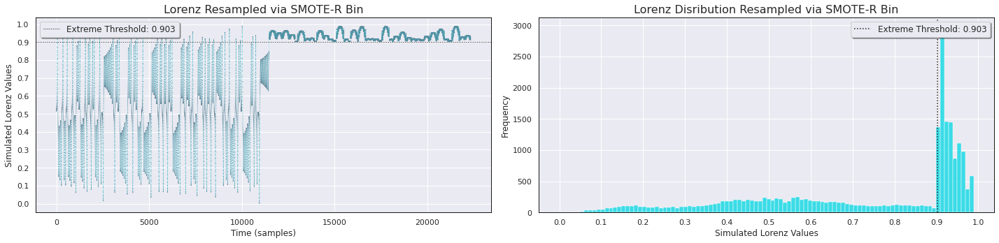

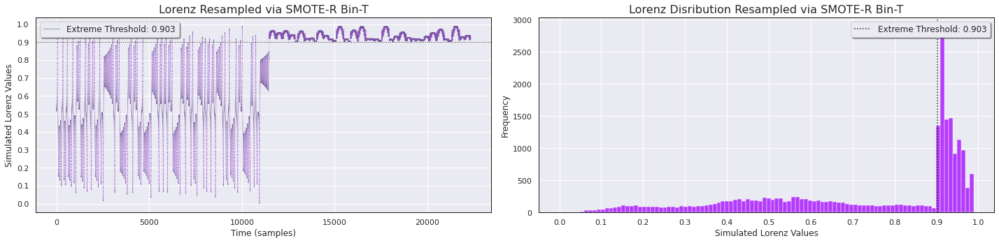

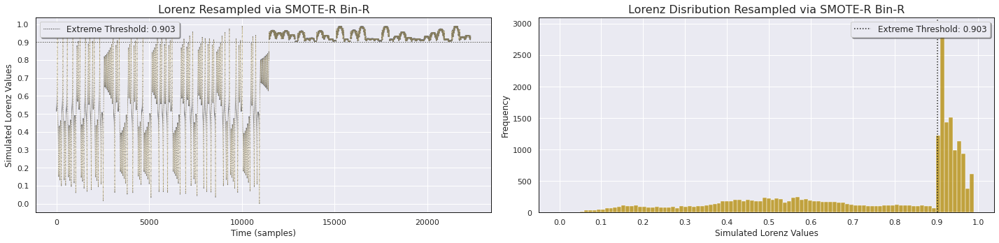

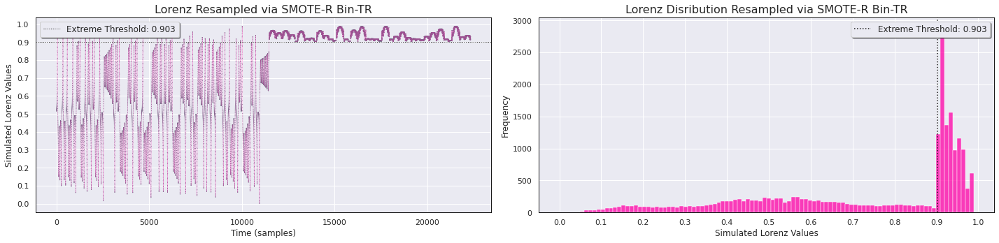

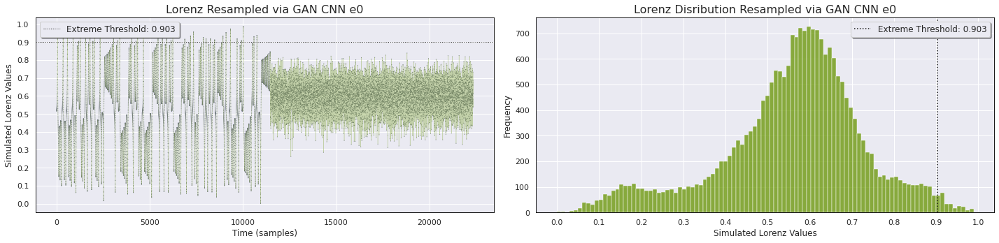

...

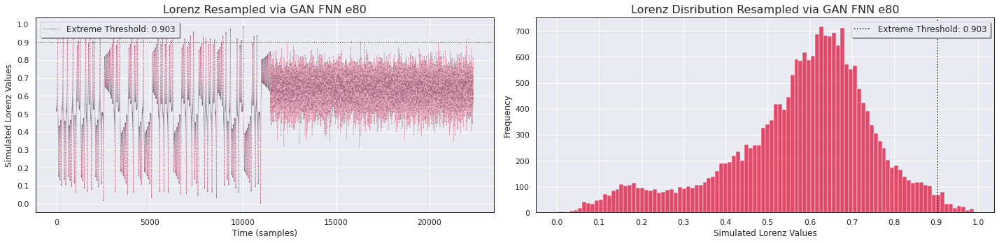

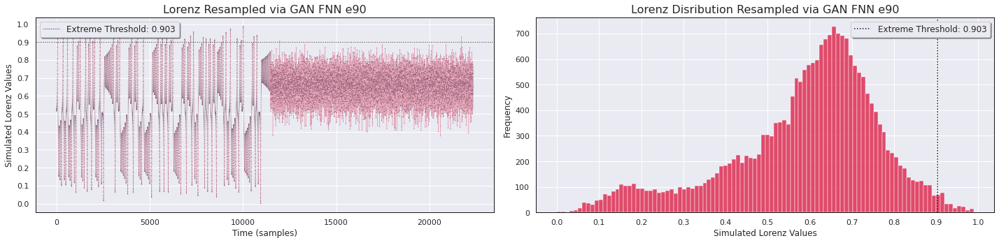

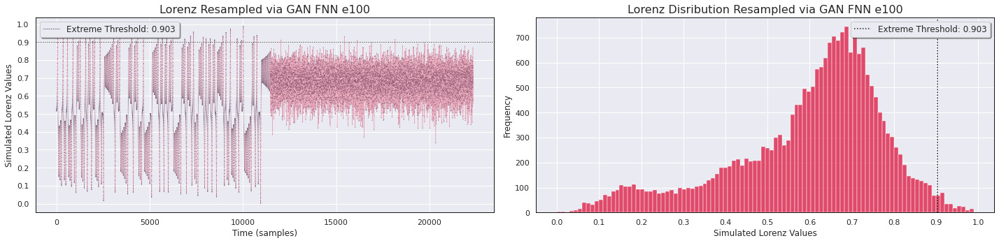

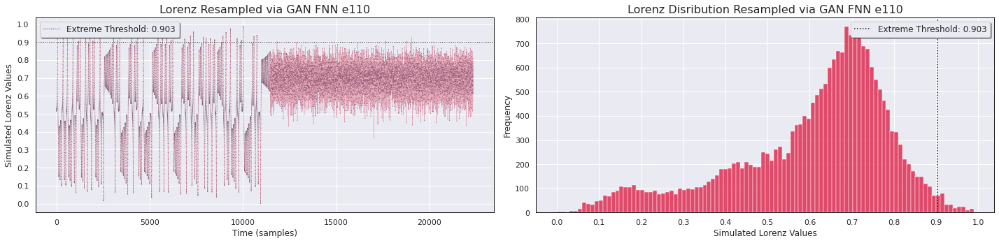

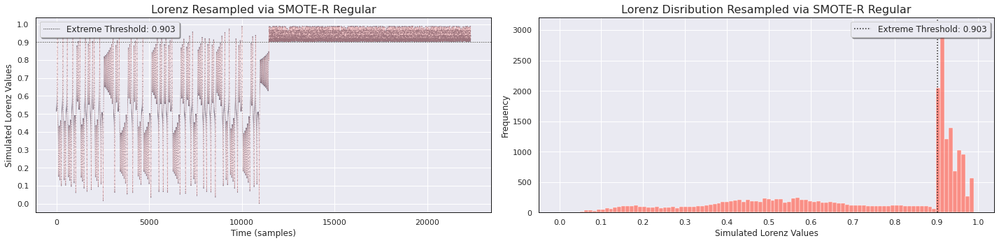

In [53]:
#import plt_utils as pu
#importlib.reload(pu)
#only plots first step out in each embedded
pu.PlotResampledResults(resampling_results, k_X.shape[0], N_STEPS_OUT,EXTREMES_THRESHOLD, TVAR, DATA_NAME)

### Remove Bad GANs

Save time training the forecasters by removing GANs that will clearly generate bad results

In [54]:
all_resampling_results = resampling_results.copy() #save a copy just incase
to_delete = ['GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90']
print(resampling_results.keys())
for d in to_delete:
    del resampling_results[d]
print(resampling_results.keys())

dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])
dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])


# **Running Forecasting Experiments**

**Init Evaluator object for model eval metrics**

In [55]:
import evaluator as ev
importlib.reload(ev)

#NOTE: evaler_params must include CaseWeight else errors in MODEL_LSTM
evaluator_params = { "RMSE": {},
                     "RMSERare": {},
                     "Utility": {'m':0.5},
                     "CaseWeight": {'m':0.5},
                     "PrecisionRecall": {},
                     "FScore": {'beta':0.5},
                     #"RelevanceROC": {},
                   }
EVALERS = {}
for f in FORECASTERS:
    EVALERS[f] = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)

#EVALER = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)
RECORDER.save_param_dict({"Evaluator":evaluator_params})

**Train and evaluate an LSTM for each resampling strategy**

In [56]:
NUM_EXPERIMENTS = 10

def main(time_step, X_train, X_test, Y_train, Y_test, resampling_results, evalers, recorder, train_params):   
    recorder.log_print(f"Starting forecasting experiments with num_exps: {train_params['num_exp']} and epochs: {train_params['epochs']}")
    recorder.save_param_dict({"Forecasting":{"NumExp":train_params['num_exp'], "nEpochs": train_params['epochs'], "hidden":train_params['hidden']}})
    
    forecast_results = {}
    for f in FORECASTERS:
        print(f"############## no_resample : {f} ##############")
        if f == "LSTM":
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
        else:
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
    
        results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_train,'Y_train':Y_train,'model':best_model}
        forecast_results[f] = {}
        forecast_results[f]['no_resample'] = results
    
    
    for key in resampling_results.keys():
        res = resampling_results[key]
        X_res = res[:,:(N_STEPS_IN*N_FVARS)]
        X_res = X_res.reshape((X_res.shape[0],N_STEPS_IN,N_FVARS))
        Y_res = res[:,(N_STEPS_IN*N_FVARS):]
        for f in FORECASTERS:
            print(f"############## {key} : {f} ##############")
            if f == "LSTM":
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
            else:
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
        
            results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_res,'Y_train':Y_res,'model':best_model}
            forecast_results[f][key] = results
    
    return forecast_results

TRAIN_PARAMS = {
        'num_exp': NUM_EXPERIMENTS, 
        'n_steps_in': N_STEPS_IN,
        'n_steps_out': N_STEPS_OUT,
        'epochs': 100,
        'hidden': 100,
        'forecast_dir': FORECAST_DIR,
        'n_fvars': N_FVARS
    }

forecast_results = main(N_STEPS_IN, X_train, X_test, Y_train, Y_test, resampling_results, EVALERS, RECORDER, TRAIN_PARAMS)

print("$$$$ FINISHED FORECASTING EXPERIMENTS $$$$")

LOG: 22:35:33:530 Starting forecasting experiments with num_exps: 10 and epochs: 100

############## no_resample : LSTM ##############
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 5)                 505       
                                                                 
Total params: 41,305
Trainable params: 41,305
Non-trainable params: 0
_________________________________________________________________
LOG: 22:35:33:662 Starting LSTM forecaster training on no_resample

LOG: 22:35:33:663 	Experiment 1 in progress



2023-10-25 22:35:33.539898: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-25 22:35:33.540805: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-25 22:35:33.540978: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2023-10-25 22:35:33.541064: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2023-10-25 22:35:33.541157: W tensorf

154/154 [==============================] - 0s 2ms/step
LOG: 22:37:02:231 	Experiment 2 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:38:29:154 	Experiment 3 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:39:53:465 	Experiment 4 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:42:16:537 	Experiment 5 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:43:44:473 	Experiment 6 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:45:12:375 	Experiment 7 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:46:39:749 	Experiment 8 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:48:07:673 	Experiment 9 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:49:35:256 	Experiment 10 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:51:03:137 Total time for 10 no_resam

154/154 [==============================] - 0s 849us/step
LOG: 23:20:30:729 	Experiment 2 in progress

154/154 [==============================] - 0s 850us/step
LOG: 23:21:05:376 	Experiment 3 in progress

154/154 [==============================] - 0s 888us/step
LOG: 23:21:40:290 	Experiment 4 in progress

154/154 [==============================] - 0s 850us/step
LOG: 23:22:15:214 	Experiment 5 in progress

154/154 [==============================] - 0s 891us/step
LOG: 23:22:49:794 	Experiment 6 in progress

154/154 [==============================] - 0s 819us/step
LOG: 23:23:25:291 	Experiment 7 in progress

154/154 [==============================] - 0s 816us/step
LOG: 23:24:00:158 	Experiment 8 in progress

154/154 [==============================] - 0s 882us/step
LOG: 23:24:34:920 	Experiment 9 in progress

154/154 [==============================] - 0s 827us/step
LOG: 23:25:09:871 	Experiment 10 in progress

154/154 [==============================] - 0s 782us/step
LOG: 23:25:44:594 Total 

154/154 [==============================] - 0s 837us/step
LOG: 00:56:15:019 	Experiment 3 in progress

154/154 [==============================] - 0s 807us/step
LOG: 00:56:50:203 	Experiment 4 in progress

154/154 [==============================] - 0s 805us/step
LOG: 00:57:25:478 	Experiment 5 in progress

154/154 [==============================] - 0s 810us/step
LOG: 00:58:00:812 	Experiment 6 in progress

154/154 [==============================] - 0s 781us/step
LOG: 00:58:35:805 	Experiment 7 in progress

154/154 [==============================] - 0s 849us/step
LOG: 00:59:11:289 	Experiment 8 in progress

154/154 [==============================] - 0s 812us/step
LOG: 00:59:46:524 	Experiment 9 in progress

154/154 [==============================] - 0s 765us/step
LOG: 01:00:21:780 	Experiment 10 in progress

154/154 [==============================] - 0s 847us/step
LOG: 01:00:57:492 Total time for 10 SMOTER_bin_tr experiments 352.90143179893494

############## GAN_CNN_e100 : LSTM #########

154/154 [==============================] - 0s 788us/step
LOG: 02:32:39:037 	Experiment 5 in progress

154/154 [==============================] - 0s 858us/step
LOG: 02:33:14:426 	Experiment 6 in progress

154/154 [==============================] - 0s 817us/step
LOG: 02:33:49:368 	Experiment 7 in progress

154/154 [==============================] - 0s 852us/step
LOG: 02:34:23:958 	Experiment 8 in progress

154/154 [==============================] - 0s 907us/step
LOG: 02:34:59:423 	Experiment 9 in progress

154/154 [==============================] - 0s 808us/step
LOG: 02:35:34:253 	Experiment 10 in progress

154/154 [==============================] - 0s 869us/step
LOG: 02:36:09:504 Total time for 10 GAN_FNN_e100 experiments 351.28614139556885

############## GAN_FNN_e110 : LSTM ##############
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 100)    

## *SAVE EVALER RESULTS ---- DON'T FORGET*

In [57]:
for f in FORECASTERS:
    RECORDER.save_all_evaler_exps(EVALERS[f].getResultsDf(), f)

### Plot Actual vs Predicted

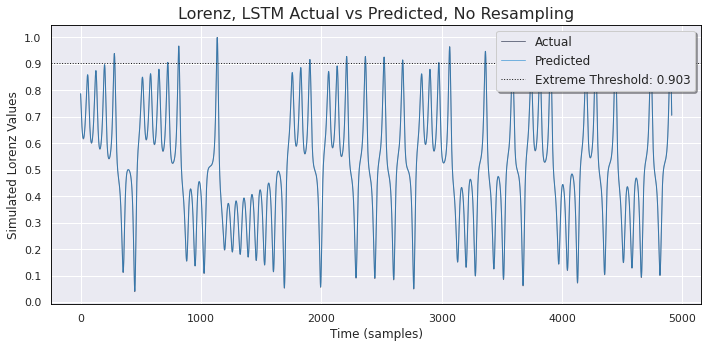

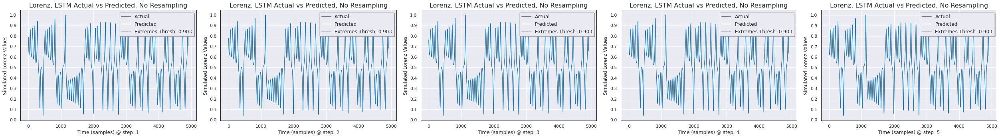

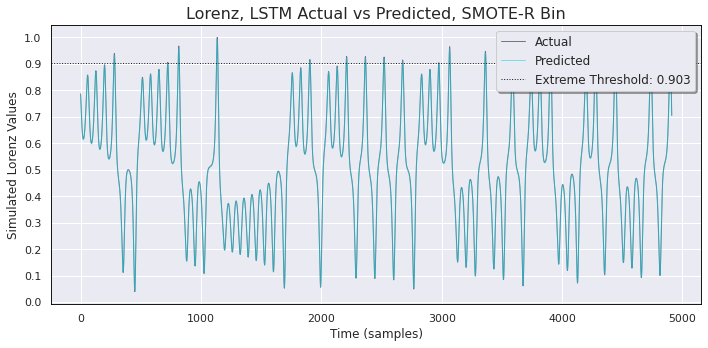

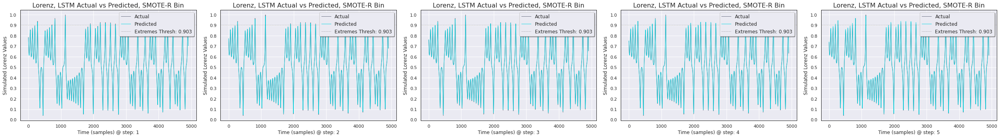

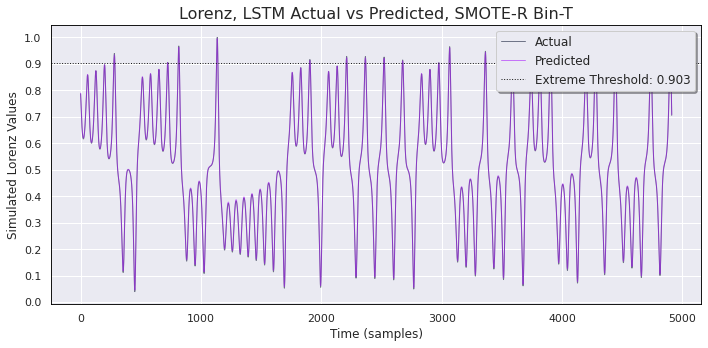

...

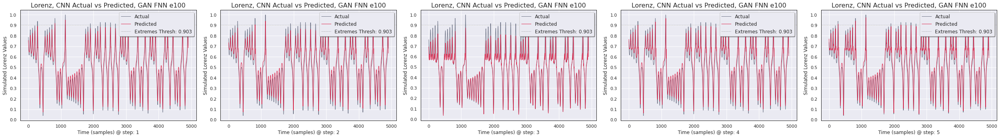

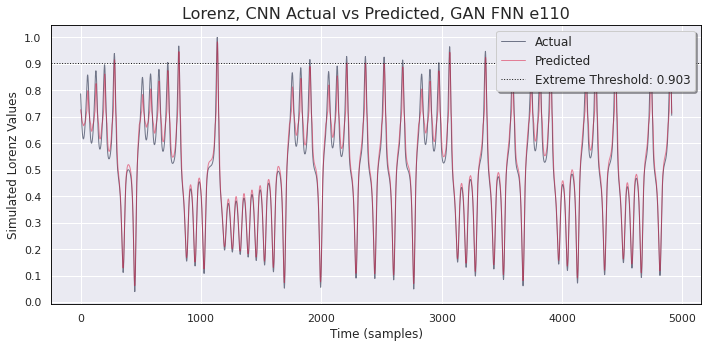

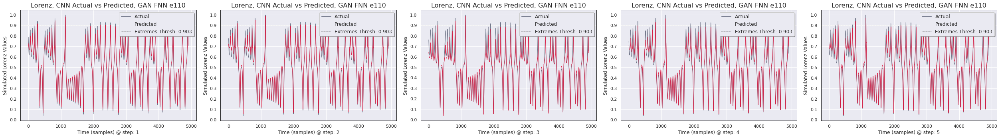

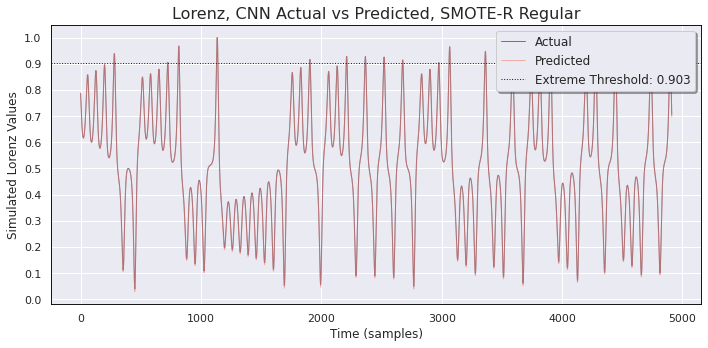

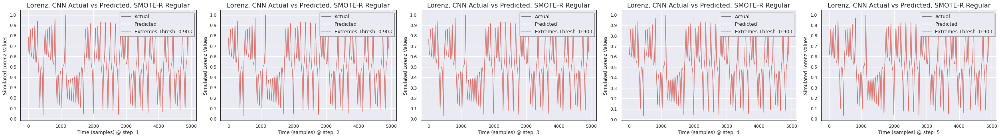

In [58]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
#print(forecast_results)
#PLOT PRED VS ACTUAL + SAVE_EVAL_RESULTS
for f in FORECASTERS:
    for key in forecast_results[f].keys():
        y_predict_test = forecast_results[f][key]['predict_test']
        #Plot a single Actual vs Predicted figure for only one chosen step out: 0 for first step
        pu.PlotPredVsActual1D(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f, 0)
        #Plot a Actual vs Predicted for all steps out in one figure
        pu.PlotPredVsActualSteps(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, N_STEPS_OUT, f)
        #Save forecasting model
        RECORDER.save_LSTM(forecast_results[f][key]['model'], key)
        #TODO: save CNN and LSTM with same function

### Record KS Statistic and Plot Extremes Distribution for Each Resampling Strategy

KS statistic: 0.08795575281064924, p-value: 0.025453240757817852


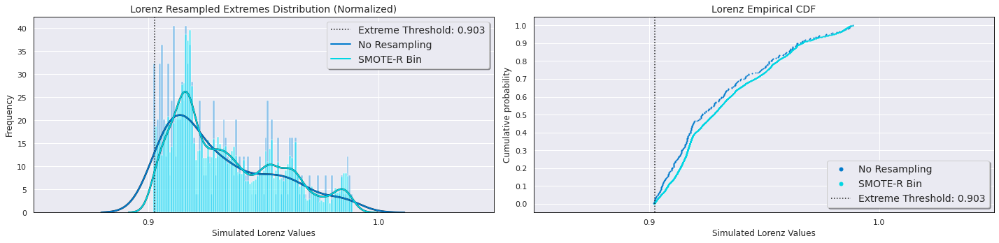

KS statistic: 0.09204434151962934, p-value: 0.016839951583687215


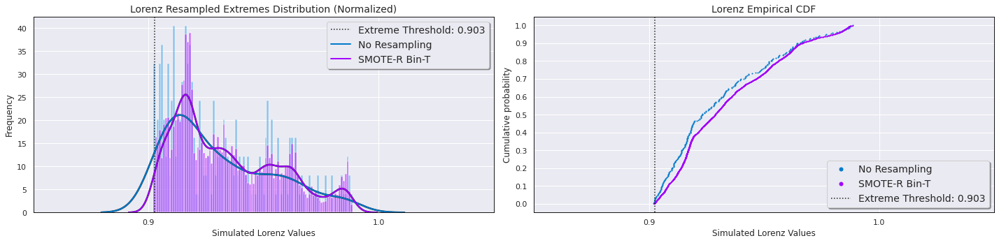

KS statistic: 0.10978786692513162, p-value: 0.0022549140035480787


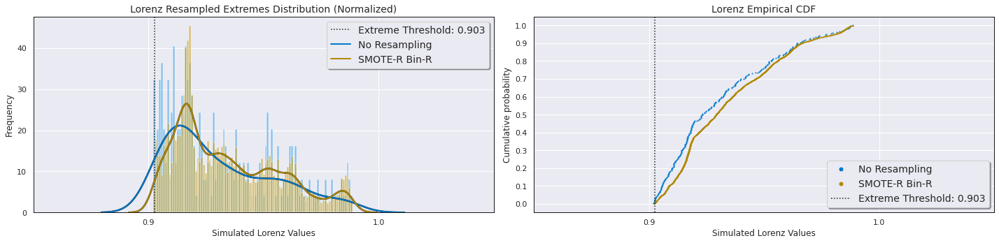

KS statistic: 0.10871250174904057, p-value: 0.00257299985983658


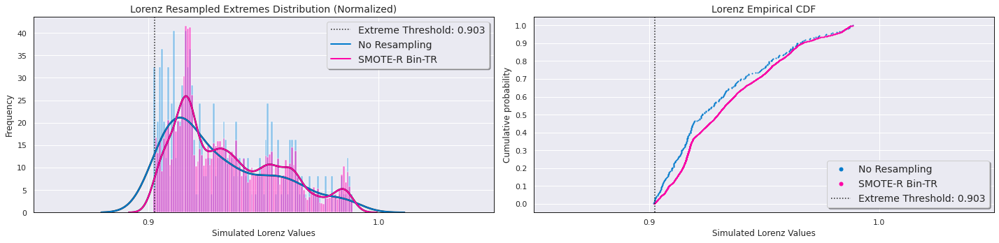

KS statistic: 0.9744600770678377, p-value: 0.0


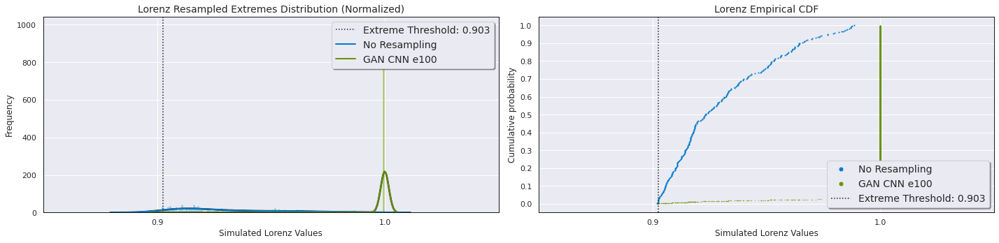

KS statistic: 0.9744600770678377, p-value: 0.0


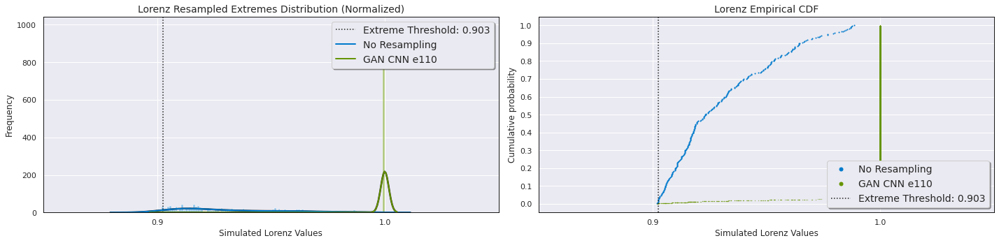

KS statistic: 0.006689734717416378, p-value: 1.0


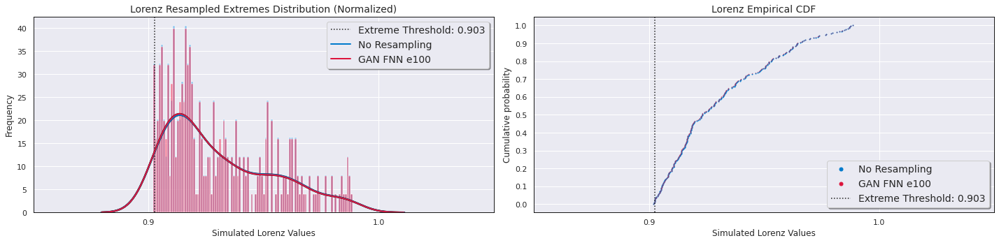

KS statistic: 0.006761695906432748, p-value: 1.0


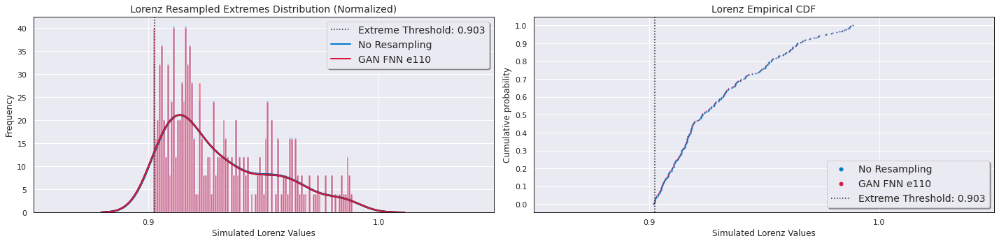

KS statistic: 0.018286926944273096, p-value: 0.9999703042814209


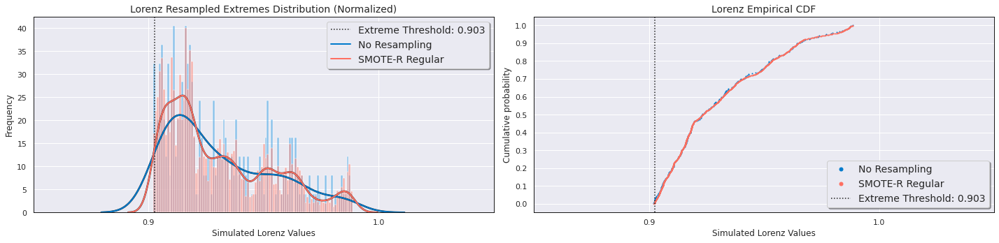

In [59]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
from scipy.stats import ks_2samp
import scipy.stats as stats

step_out = 0
#get extremes for original data
y_orig_rel = RELEVANCE_FUNCTION.__call__(Y_train[:,step_out])
rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_orig_rel]
y_orig_rare = Y_train[rare_mask]
ks_results = []
for key, res in resampling_results.items():
    #get extremes for resampled data
    y_res = res[:,(N_STEPS_IN*N_FVARS):]
    y_rel = RELEVANCE_FUNCTION.__call__(y_res[:,step_out])
    rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_rel]
    y_rare = y_res[rare_mask]

    # Perform the Kolmogorov-Smirnov test
    statistic, p_value = ks_2samp(y_orig_rare[:,step_out], y_rare[:,step_out])
    print(f"KS statistic: {statistic}, p-value: {p_value}")
    ks_results.append({'Res':key, 'ksStat':statistic, 'pValue':p_value})
    #Plot extremes hist and cdf for each strategy vs original data
    pu.PlotExremesDistribution(y_orig_rare, y_rare, key, step_out, EXTREMES_THRESHOLD, TVAR, DATA_NAME)
    

ks_df = pd.DataFrame(ks_results)
RECORDER.save_ks(ks_df)

### Prepare Data for Comparison Plots

If we include all strategies on the comparison plots they will be really cluttered and almost useless to the reader. In the following cell we choose the best CNN_GAN, FNN_GAN, and SMOTER_bin approach from the RMSERare of the forecasting results and only include these on the comparison plots. 

Later we'll also use this cell to load the base resampling results / eval metrics to include on the comparison plots along side the next generation of resampling strategies

In [60]:
def calculate_mean(lst):
    return sum(lst) / len(lst)

#Combine EVALER from loaded experiments
#Combine resampling results from loaded experiments
#np.loadtxt('test.txt', delimiter=',', dtype=float)

#TODO: come up with a way to make a copy of evaler so we don't have to filter best strategies for the clustered bar plots

#best_resampling_results will contain best GANs, best SMOTERs
best_resampling_results = resampling_results.copy()
best_cnn_gan = ""
best_fnn_gan = ""
best_bin = ""

def get_best_resampling(forecaster, best, evaler, metric, recorder):
    exp_sum = evaler.getExperimentSummaryDf(metric)
    #get best CNN_GAN if used
    cnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_CNN")]
    if not cnn_exp_sum.empty:
        #apply mean to all rows
        cnn_exp_sum[f"{metric}_Test_Mean"] = cnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = cnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_cnn_gan = cnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best CNN_GAN for {forecaster}: {best_cnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_CNN" in key and key != best_cnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['cnn_gan'] = best_cnn_gan
        ekey = int(best_cnn_gan.split('_')[-1][1:])
        recorder.save_gan(CNN_GENS[ekey], CNN_DISCS[ekey], "CNN", best_cnn_gan)
    
    #get best FNN_GAN if used
    fnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_FNN")]
    if not fnn_exp_sum.empty:
        #apply mean to all rows
        fnn_exp_sum[f"{metric}_Test_Mean"] = fnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = fnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_fnn_gan = fnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best FNN_GAN for {forecaster}: {best_fnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_FNN" in key and key != best_fnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['fnn_gan'] = best_fnn_gan
        ekey = int(best_fnn_gan.split('_')[-1][1:])
        RECORDER.save_gan(FNN_GENS[ekey], FNN_DISCS[ekey], "FNN", best_fnn_gan)
    #get best SMOTER_bin if used
    bin_exp_sum = exp_sum[exp_sum['Res'].str.contains("SMOTER_bin")] 
    if not bin_exp_sum.empty:
        bin_exp_sum[f"{metric}_Test_Mean"] = bin_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = bin_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_bin = bin_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best SMOTER bin for {forecaster}: {best_bin}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "SMOTER_bin" in key and key != best_bin]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['bin'] = best_bin
    return best #?
                                                         

BEST_RESULTS = {}
for f in FORECASTERS:
    BEST_RESULTS[f] = {'resampling_results': resampling_results.copy(), 'cnn_gan': "", 'fnn_gan': "", "bin": ""}
    #do below stuff with argument 'f'
    BEST_RESULTS[f] = get_best_resampling(f, BEST_RESULTS[f], EVALERS[f], 'RMSERare', RECORDER) #?
    RECORDER.save_resample_results_np(BEST_RESULTS[f]['resampling_results'], f)


#load all resampling results
#COMBINE_RESAMPLING_RESULTS_DIR = Path("Sessions/Bike/2023-October-13 13-41-03-532984").joinpath("resample_results")

#add loaded resampling results to best_resampling_results
#best_resampling_results.update({file.stem: np.loadtxt(file, delimiter=',', dtype=float)
#                  for file in COMBINE_RESAMPLING_RESULTS_DIR.iterdir() if file.is_file()})

Best CNN_GAN for LSTM: GAN_CNN_e110
deleting keys: ['GAN_CNN_e100']
Best FNN_GAN for LSTM: GAN_FNN_e100
deleting keys: ['GAN_FNN_e110']
Best SMOTER bin for LSTM: SMOTER_bin_r
deleting keys: ['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_tr']
LOG: 03:44:40:148 Saving resample results numpy style

Best CNN_GAN for CNN: GAN_CNN_e110
deleting keys: ['GAN_CNN_e100']
Best FNN_GAN for CNN: GAN_FNN_e110
deleting keys: ['GAN_FNN_e100']
Best SMOTER bin for CNN: SMOTER_bin_r
deleting keys: ['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_tr']
LOG: 03:44:40:892 Saving resample results numpy style



### Compare KDEs and CDFs

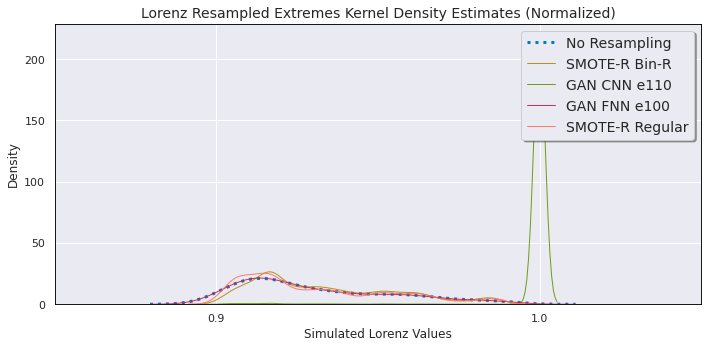

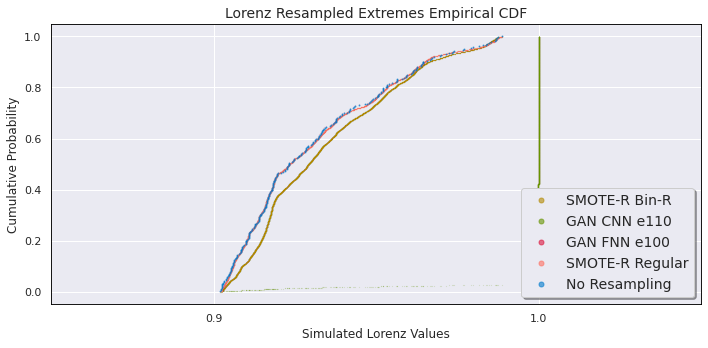

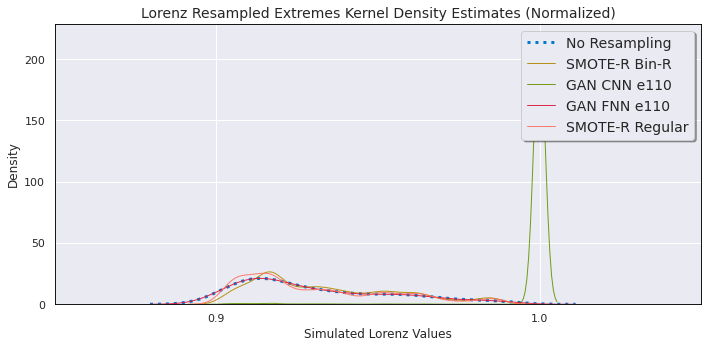

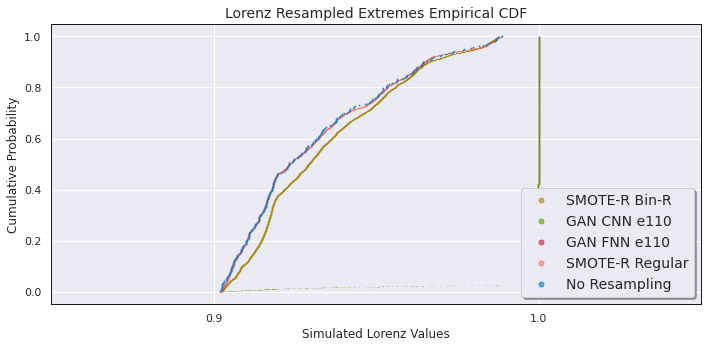

In [61]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
step_out = 0

#compare KDE, CDF
for f in FORECASTERS:
    pu.PlotKDECompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    
    pu.PlotCDFCompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    

### Plot Eval Results Aggregated Over All Steps

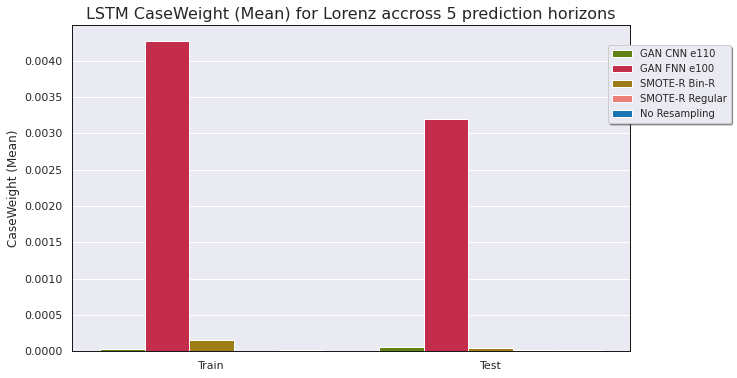

<Figure size 720x432 with 0 Axes>

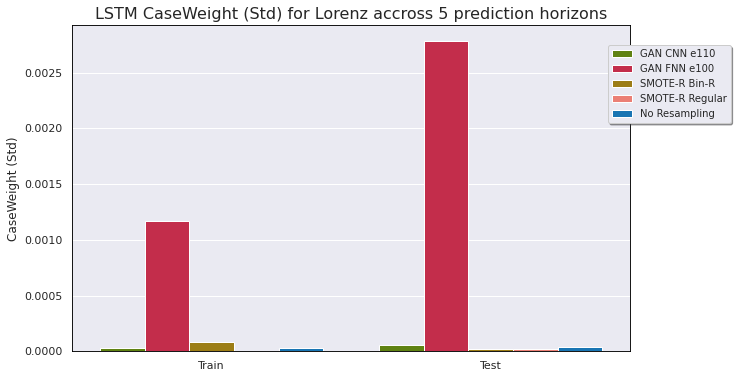

<Figure size 720x432 with 0 Axes>

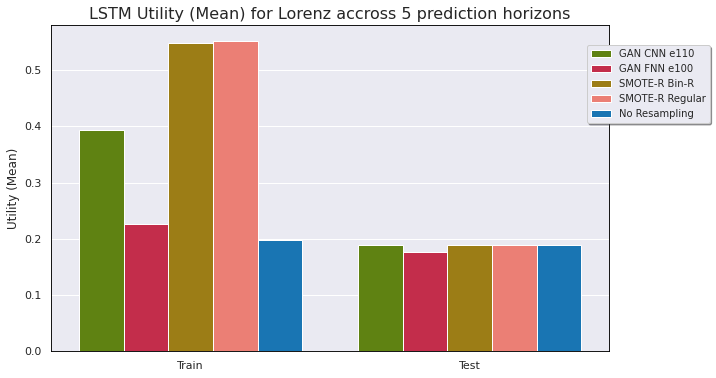

<Figure size 720x432 with 0 Axes>

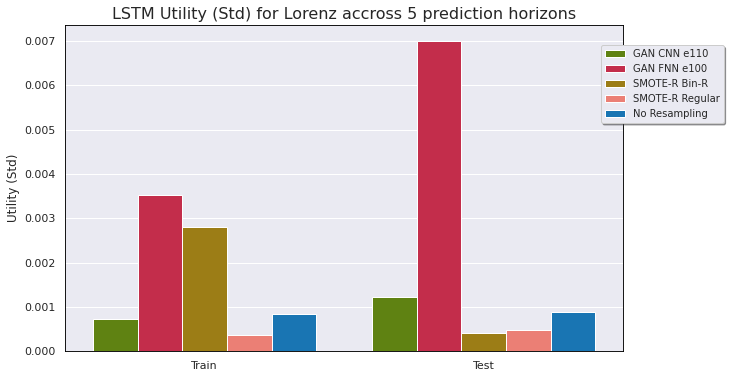

<Figure size 720x432 with 0 Axes>

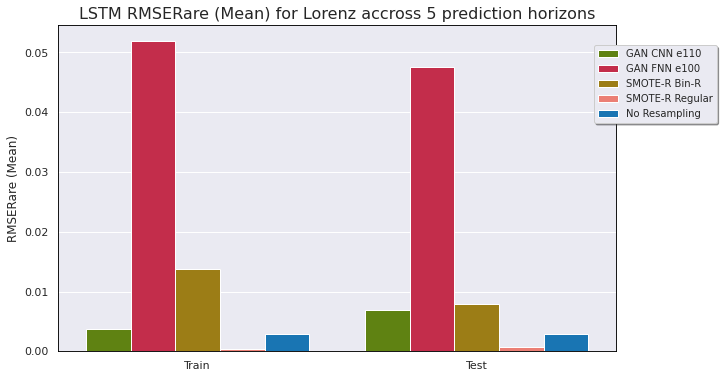

<Figure size 720x432 with 0 Axes>

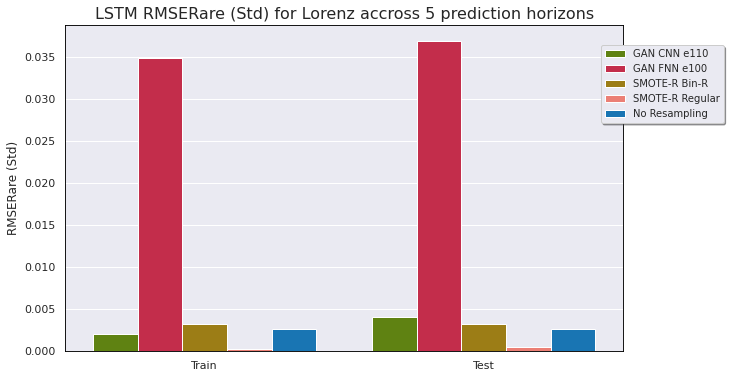

<Figure size 720x432 with 0 Axes>

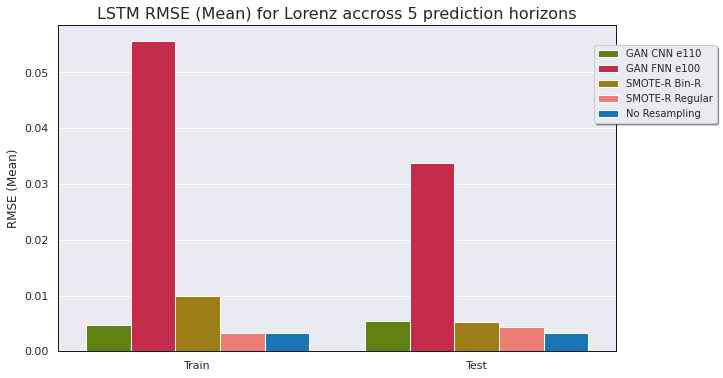

<Figure size 720x432 with 0 Axes>

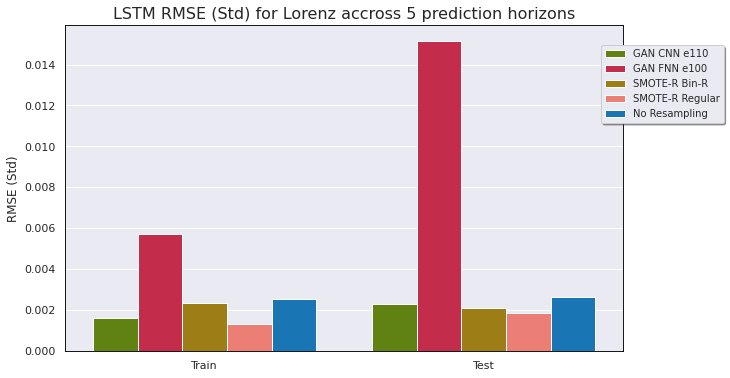

<Figure size 720x432 with 0 Axes>

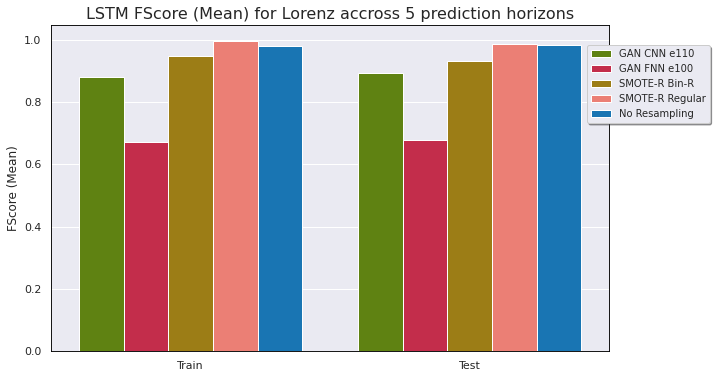

<Figure size 720x432 with 0 Axes>

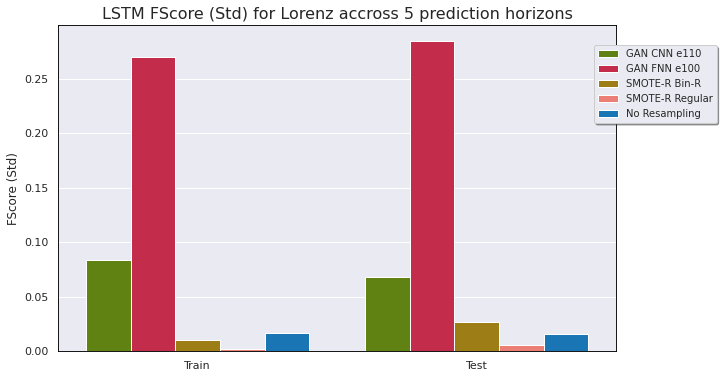

<Figure size 720x432 with 0 Axes>

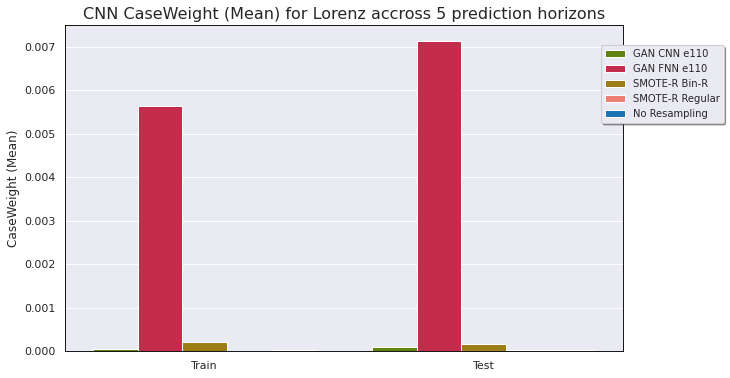

<Figure size 720x432 with 0 Axes>

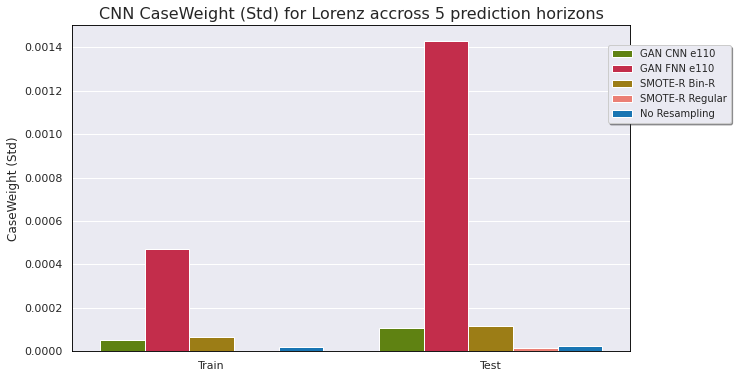

<Figure size 720x432 with 0 Axes>

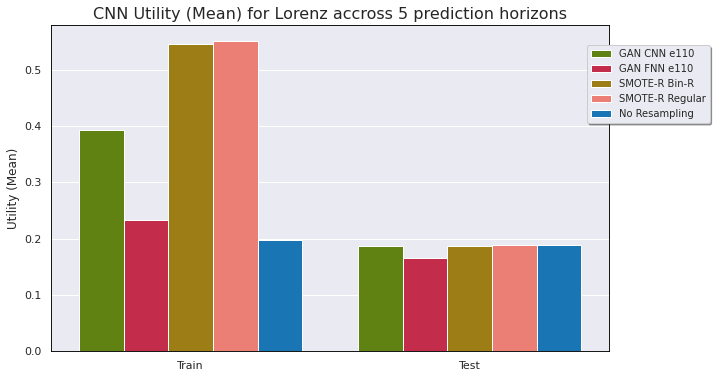

<Figure size 720x432 with 0 Axes>

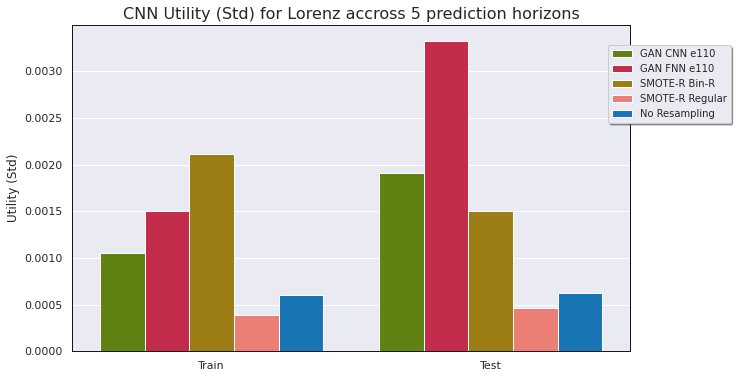

<Figure size 720x432 with 0 Axes>

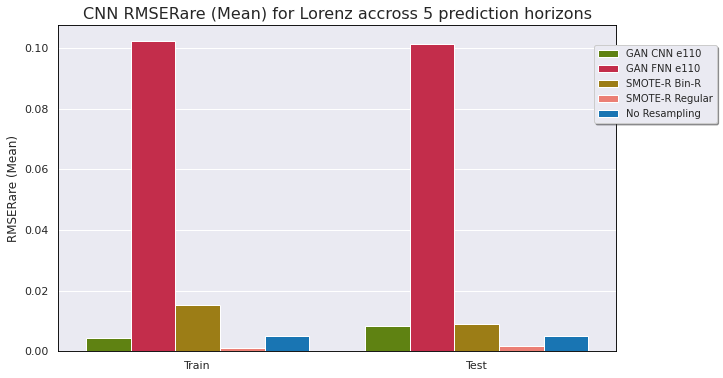

<Figure size 720x432 with 0 Axes>

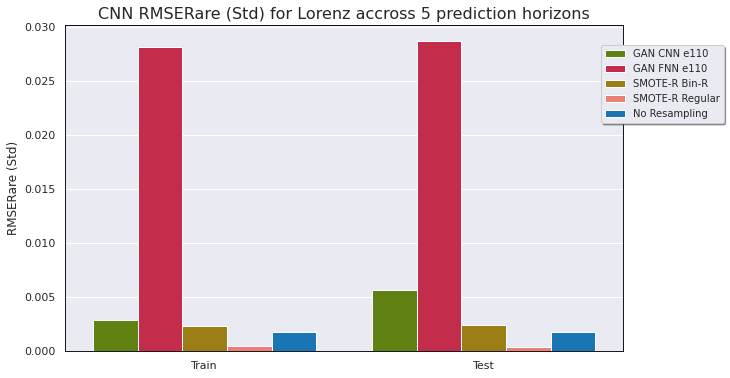

<Figure size 720x432 with 0 Axes>

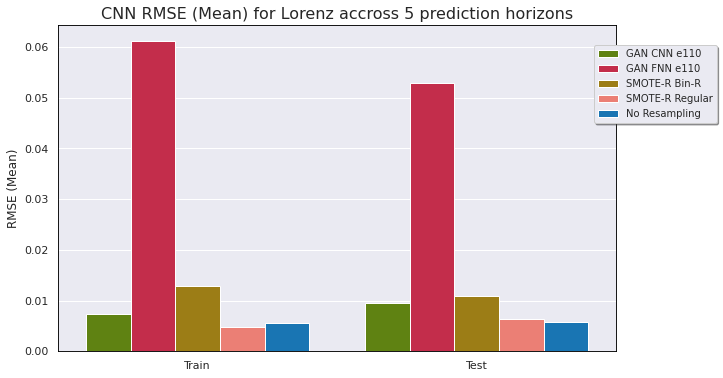

<Figure size 720x432 with 0 Axes>

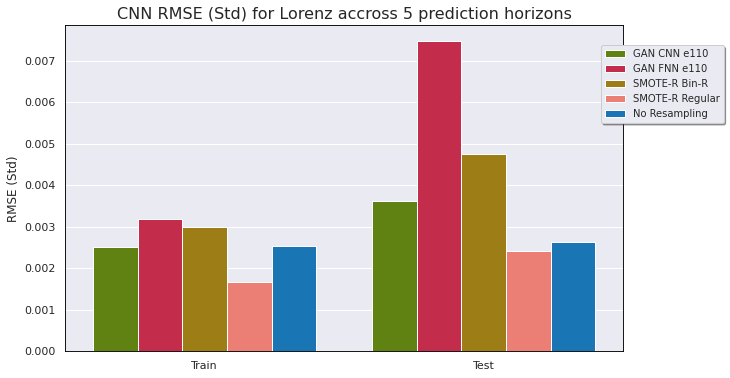

<Figure size 720x432 with 0 Axes>

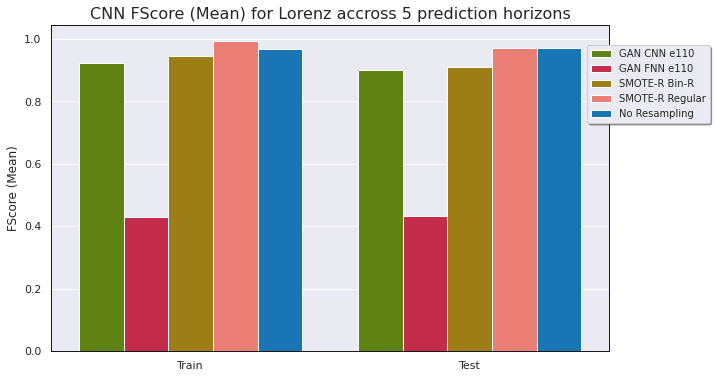

<Figure size 720x432 with 0 Axes>

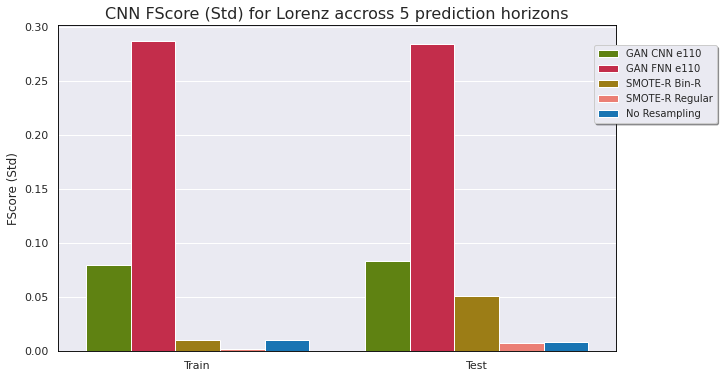

<Figure size 720x432 with 0 Axes>

In [62]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)


def calculate_mean(lst):
    return sum(lst) / len(lst)

#Just plot these metrics:
plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]

ts = ["Train", "Test"] #one cluster for train, one for test results

#aggs options: 
aggs = ["Mean", "Std"]
## for "Mean" we get the mean of the eval metrics over all experiments and plot its average over time steps
## for "Std" we get the std of the eval metrics over all experiments and plot its average over time steps

#for f in FORECASTERS: EVALER[f], get best_cnn_gan, best_fnn_gan, best_bin from dict
#pass an argument to plotting function to specify f
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        df_results = EVALERS[f].getExperimentSummaryDf(metric, True)
        df_results_train = EVALERS[f].getExperimentSummaryDf(metric, False)
        df_results[f"{metric}_Train_Mean"] = df_results_train[f"{metric}_Train_Mean"]
        df_results[f"{metric}_Train_Std"] = df_results_train[f"{metric}_Train_Std"]
        # Replace with the mean of the steps out lists
        df_results[f"{metric}_Train_Mean"] = df_results[f"{metric}_Train_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Test_Mean"] = df_results[f"{metric}_Test_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Train_Std"] = df_results[f"{metric}_Train_Std"].apply(calculate_mean)
        df_results[f"{metric}_Test_Std"] = df_results[f"{metric}_Test_Std"].apply(calculate_mean)
        for a in aggs:
            #remove any GAN_CNNs, GAN_FNNs, and SMOTER_bin strategies from the dataframe that aren't the best
            filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
            filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
            '''
            filtered_df = df_results
            if best_cnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_CNN')) & (filtered_df['Res'] == best_cnn_gan)) | (~filtered_df['Res'].str.contains('GAN_CNN'))]
            if best_fnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_FNN')) & (filtered_df['Res'] == best_fnn_gan)) | (~filtered_df['Res'].str.contains('GAN_FNN'))]
            '''
            pu.PlotTrainTestBarResults(filtered_df, metric, a, DATA_NAME, N_STEPS_OUT, f)


### Plot Train and Test Eval Results Clustered By Steps Out

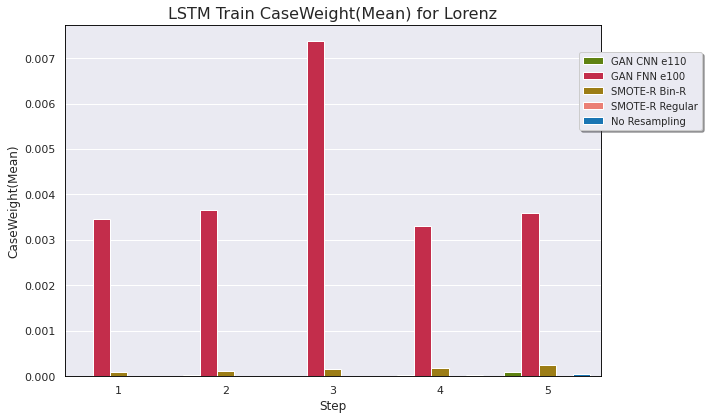

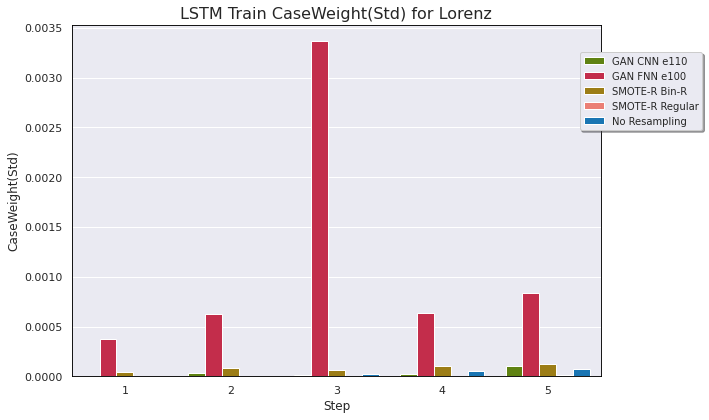

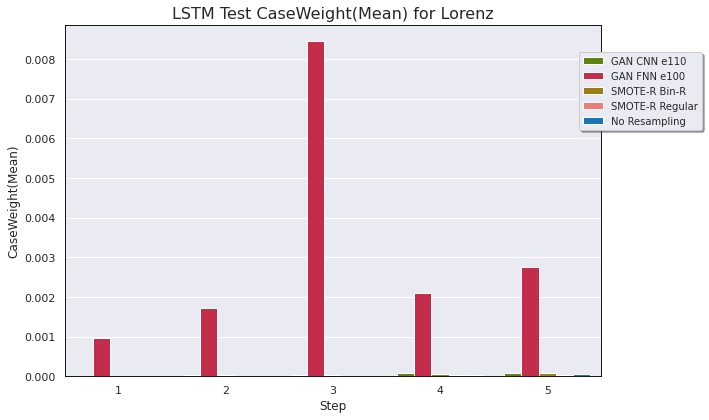

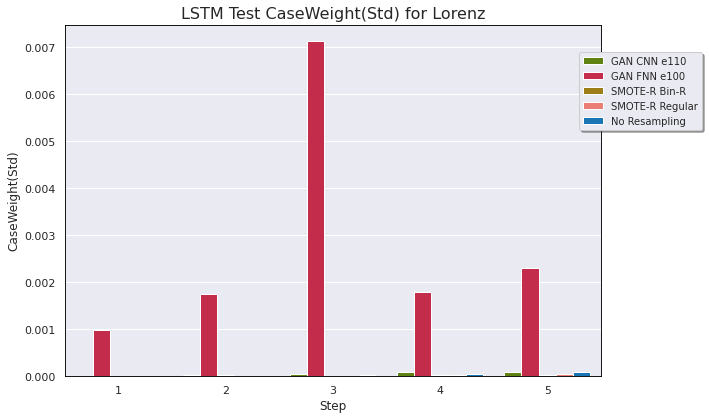

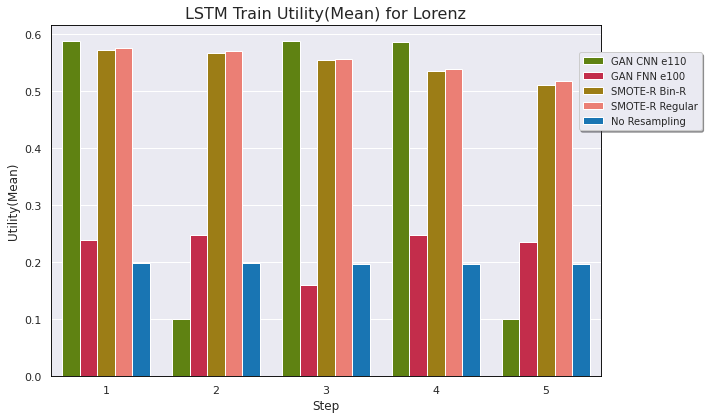

...

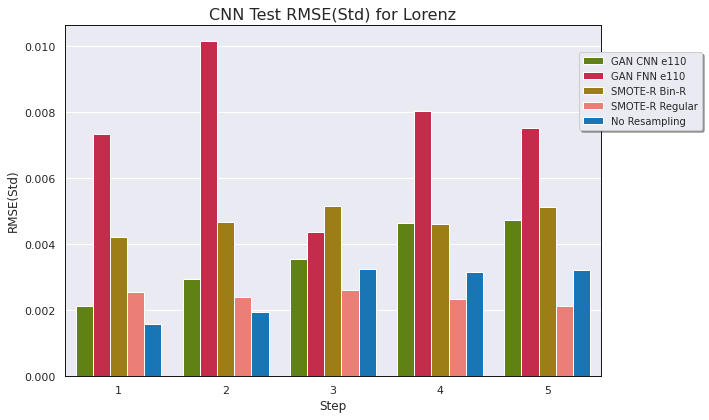

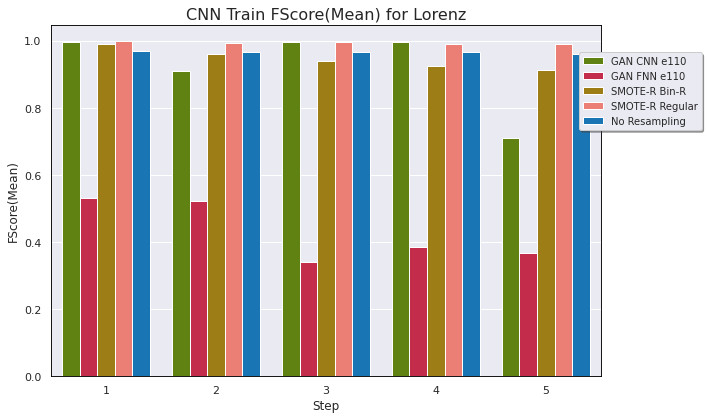

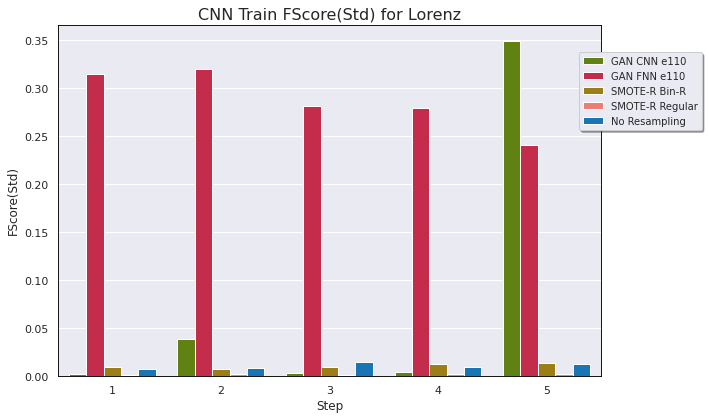

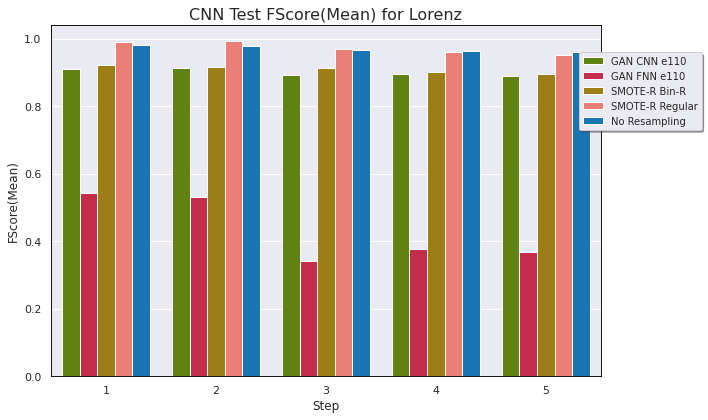

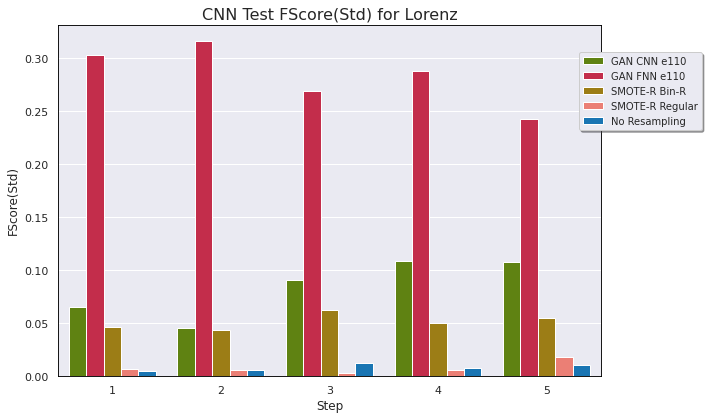

In [63]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)



plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]
ts = ["Train", "Test"]
aggs = ["Mean", "Std"]
#either plot mean or std of the experiments
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        for t in ts:
            tb = True if t == "Test" else False
            df_results = EVALERS[f].getExperimentSummaryDf(metric, tb)
            for a in aggs:
                #filter out all GAN_CNNs, GAN_FNNs or SMOTER_bins that aren't the best
                filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
                pu.PlotStepBarResults(filtered_df, metric, a, t, DATA_NAME, N_STEPS_OUT, f)